# Pre-Trained Models

In [12]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from prophet import Prophet
import pmdarima as pm
from xgboost import XGBRegressor
import joblib

class ModelComparator:
    def __init__(self, model_save_path='saved_models'):
        self.scalers = {}
        self.metrics = {}
        self.model_save_path = model_save_path
        os.makedirs(model_save_path, exist_ok=True)
    
    def prepare_data(self, df, target_col):
        df['start_time'] = pd.to_datetime(df['start_time'])
        df = df.sort_values(by='start_time')
        
        df['year'] = df['start_time'].dt.year
        df['month'] = df['start_time'].dt.month
        df['day'] = df['start_time'].dt.day
        df['day_of_week'] = df['start_time'].dt.dayofweek
        df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)
        
        split_idx = int(len(df) * 0.8)
        train, test = df.iloc[:split_idx], df.iloc[split_idx:]
        
        scaler = MinMaxScaler()
        train_scaled = scaler.fit_transform(train[target_col].values.reshape(-1, 1))
        test_scaled = scaler.transform(test[target_col].values.reshape(-1, 1))
        
        self.scalers[target_col] = scaler
        return train, test, train_scaled, test_scaled
    
    def train_prophet(self, train_data, target_col):
        prophet_data = pd.DataFrame({'ds': train_data['start_time'], 'y': train_data[target_col]})
        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(prophet_data)
        return model
    
    def train_arima(self, train_data, target_col):
        model = pm.auto_arima(train_data[target_col], seasonal=False, m=7, stepwise=True, suppress_warnings=True)
        return model
    
    def train_xgboost(self, train_data, target_col):
        X_train = train_data[['year', 'month', 'day', 'day_of_week', 'is_weekend']].values
        y_train = train_data[target_col].values
        model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
        model.fit(X_train, y_train)
        return model
    
    def evaluate_models(self, df, target_col):
        train, test, train_scaled, test_scaled = self.prepare_data(df, target_col)
        
        results, models, predictions = {}, {}, {}
        
        try:
            prophet_model = self.train_prophet(train, target_col)
            future_dates = prophet_model.make_future_dataframe(periods=len(test))
            prophet_forecast = prophet_model.predict(future_dates)
            predictions['Prophet'] = prophet_forecast.tail(len(test))['yhat'].values
            models['Prophet'] = prophet_model
        except Exception as e:
            predictions['Prophet'] = np.zeros(len(test))
        
        try:
            arima_model = self.train_arima(train, target_col)
            predictions['ARIMA'] = arima_model.predict(n_periods=len(test))
            models['ARIMA'] = arima_model
        except Exception as e:
            predictions['ARIMA'] = np.zeros(len(test))
        
        try:
            xgb_model = self.train_xgboost(train, target_col)
            X_test = test[['year', 'month', 'day', 'day_of_week', 'is_weekend']].values
            predictions['XGBoost'] = xgb_model.predict(X_test)
            models['XGBoost'] = xgb_model
        except Exception as e:
            predictions['XGBoost'] = np.zeros(len(test))
        
        for model_name, preds in predictions.items():
            test_values = test[target_col].values[:len(preds)]
            mae, mse = mean_absolute_error(test_values, preds), mean_squared_error(test_values, preds)
            rmse, r2 = np.sqrt(mse), r2_score(test_values, preds)
            accuracy = (1 - (mae / np.mean(test_values))) * 100
            results[model_name] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'R2': r2, 'Accuracy %': accuracy}
        
        return models, results, test, predictions
    
    def save_best_model(self, models, results, sector, gas):
        best_model_name = min(results, key=lambda x: results[x]['RMSE'])
        best_model = models[best_model_name]
        sector_path = os.path.join(self.model_save_path, sector)
        os.makedirs(sector_path, exist_ok=True)
        joblib.dump(best_model, os.path.join(sector_path, f'{gas}_{best_model_name}.joblib'))
        joblib.dump(self.scalers[gas], os.path.join(sector_path, f'{gas}_scaler.joblib'))
        pd.DataFrame(results).to_csv(os.path.join(sector_path, f'{gas}_metrics.csv'))
        return best_model_name, results[best_model_name]
    
    def compare_sectors(self, sector_data_dict):
        all_results, best_models = {}, {}
        
        for sector, data in sector_data_dict.items():
            gas_columns = [col for col in data.columns if col not in ['start_time', 'year', 'month', 'day', 'day_of_week', 'is_weekend']]
            for gas in gas_columns:
                try:
                    models, results, test, predictions = self.evaluate_models(data, gas)
                    best_model_name, best_performance = self.save_best_model(models, results, sector, gas)
                    all_results.setdefault(gas, {})[sector] = results
                    best_models.setdefault(gas, {})[sector] = {'model': best_model_name, 'performance': best_performance}
                    
                    # Plot forecasts
                    accuracy = results[best_model_name]['Accuracy %']
                    self.plot_forecasts(test, predictions, gas, accuracy, sector)
                
                except Exception as e:
                    print(f"Error processing {gas} in {sector}: {e}")
        
        return all_results, best_models

    def plot_forecasts(self, test_data, predictions, gas, accuracy, sector):
        plt.figure(figsize=(10, 5))
        
        # Plot actual test data
        plt.plot(test_data['start_time'], test_data[gas], label='Actual Values', color='green')

        # Plot model-wise forecasts
        model_colors = {'Prophet': 'red', 'ARIMA': 'blue', 'XGBoost': 'orange'}
        for model, preds in predictions.items():
            plt.plot(test_data['start_time'], preds[:len(test_data)], label=f'{model} Forecast', color=model_colors[model])

        # Labels and title
        plt.xlabel('Date')
        plt.ylabel('Metric Tonnes / Day')
        plt.title(f'{gas} Emission Forecasts - Accuracy: {accuracy:.2f}%')
        
        # Legend
        plt.legend()
        plt.savefig(f'saved_models/{sector}/{gas}_evaluation_plot.png')


In [13]:
def run_comparison(sector_files):
    comparator = ModelComparator()
    sector_data = {sector: pd.read_csv(file_path) for sector, file_path in sector_files.items()}
    results, best_models = comparator.compare_sectors(sector_data)
    summary_df = pd.DataFrame([
        {'Gas': gas, 'Sector': sector, 'Best Model': best['model'], 'RMSE': best['performance']['RMSE'], 'R2': best['performance']['R2'], 'Accuracy %': best['performance']['Accuracy %']}
        for gas, sectors in best_models.items() for sector, best in sectors.items()
    ])
    summary_df.to_csv('model_comparison_summary.csv', index=False)
    return results, best_models, summary_df


In [14]:
sector_ls = ['agriculture', 'buildings', 'fluorinated_gases', 'forestry_and_land_use', 'fossil_fuel_operations', 
                 'manufacturing', 'mineral_extraction', 'power', 'transportation', 'waste']

sector_files = {}
ds_path = r'C:\Users\jaish\OneDrive\Desktop\Stuff\College\Capstone_Project\Dataset\DATA' 

for sector in sector_ls:
    sector_files[sector] = f"{ds_path}\{sector}\sector_combined_daily.csv"

In [15]:
print(sector_files)

{'agriculture': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\agriculture\\sector_combined_daily.csv', 'buildings': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\buildings\\sector_combined_daily.csv', 'fluorinated_gases': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\fluorinated_gases\\sector_combined_daily.csv', 'forestry_and_land_use': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\forestry_and_land_use\\sector_combined_daily.csv', 'fossil_fuel_operations': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\fossil_fuel_operations\\sector_combined_daily.csv', 'manufacturing': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Project\\Dataset\\DATA\\manufacturing\\sector_combined_daily.csv', 'mineral_extraction': 'C:\\Users\\jaish\\OneDrive\\Desktop\\Stuff\\College\\Capstone_Pr

13:37:21 - cmdstanpy - INFO - Chain [1] start processing
13:37:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:37:25 - cmdstanpy - INFO - Chain [1] start processing
13:37:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:37:39 - cmdstanpy - INFO - Chain [1] start processing
13:37:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:38:11 - cmdst

13:44:18 - cmdstanpy - INFO - Chain [1] start processing
13:44:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:44:50 - cmdstanpy - INFO - Chain [1] start processing
13:44:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:45:41 - cmdstanpy - INFO - Chain [1] start processing
13:45:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\jaish\miniconda3\envs\AIKA\lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (7) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
13:45:53 - cmdst

({'ch4': {'agriculture': {'Prophet': {'MAE': 523.7162277629598,
     'MSE': 416600.4499650552,
     'RMSE': 645.4459310934226,
     'R2': -0.40652127973206853,
     'Accuracy %': 91.01846267992224},
    'ARIMA': {'MAE': 445.5821944339429,
     'MSE': 297904.11162042915,
     'RMSE': 545.8059285317714,
     'R2': -0.005780172222468183,
     'Accuracy %': 92.35843211205218},
    'XGBoost': {'MAE': 481.47404765680784,
     'MSE': 355181.47379965754,
     'RMSE': 595.971034362961,
     'R2': -0.1991592930533821,
     'Accuracy %': 91.74290026079585}},
   'buildings': {'Prophet': {'MAE': 24.779316510678647,
     'MSE': 841.0848745608075,
     'RMSE': 29.001463317577745,
     'R2': -2.1002465378507935,
     'Accuracy %': 85.063019071409},
    'ARIMA': {'MAE': 18.80478172164218,
     'MSE': 540.9271414554211,
     'RMSE': 23.25784042974371,
     'R2': -0.993862389217717,
     'Accuracy %': 88.66447079678579},
    'XGBoost': {'MAE': 19.727516503740297,
     'MSE': 568.0852769809071,
     'RMSE

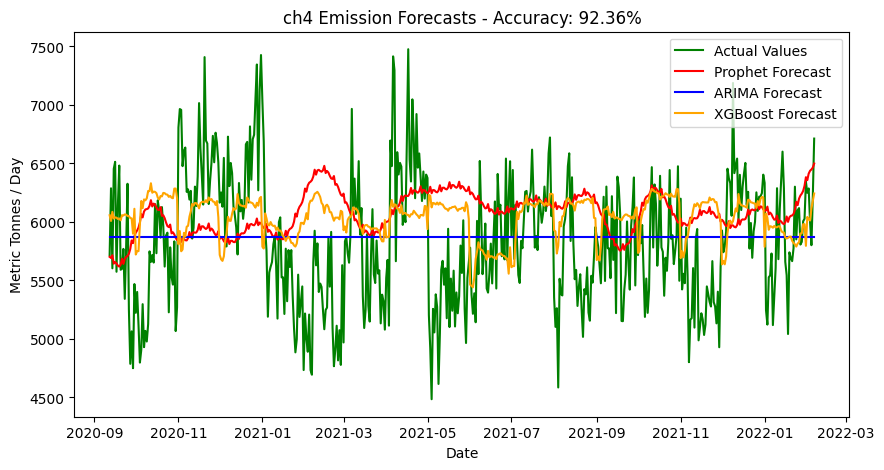

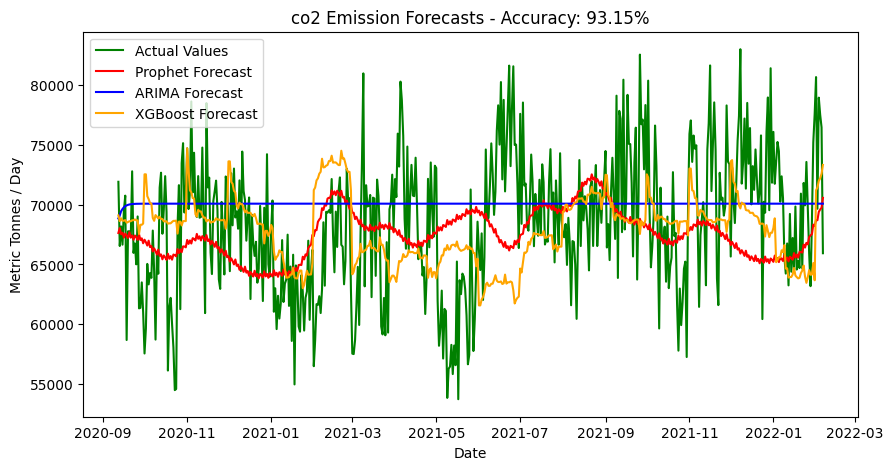

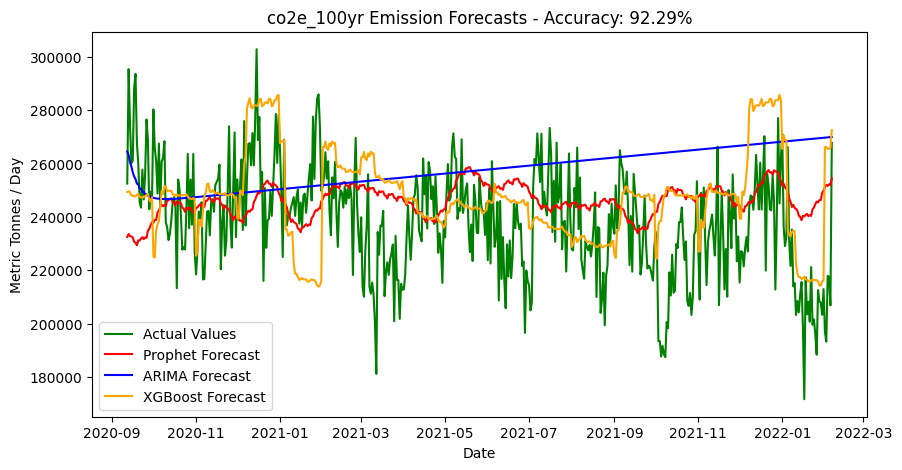

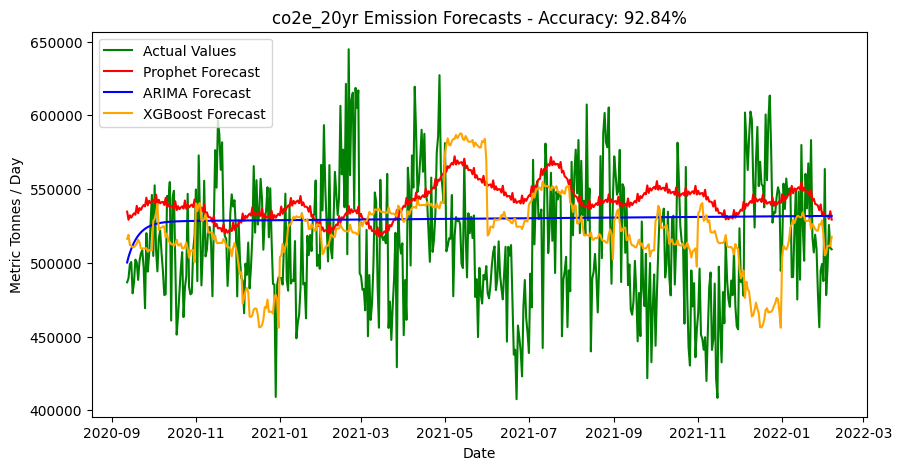

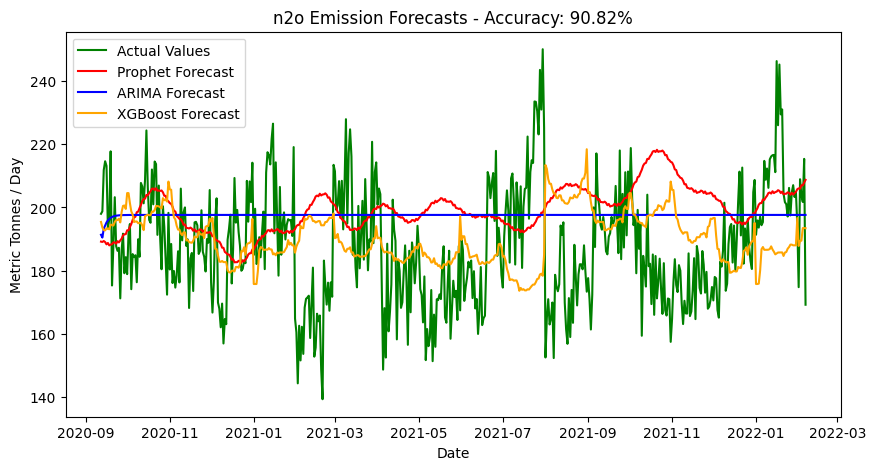

...

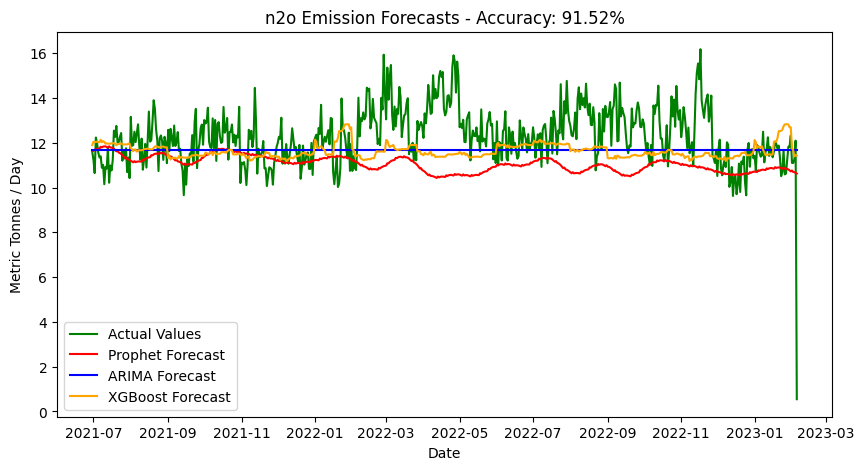

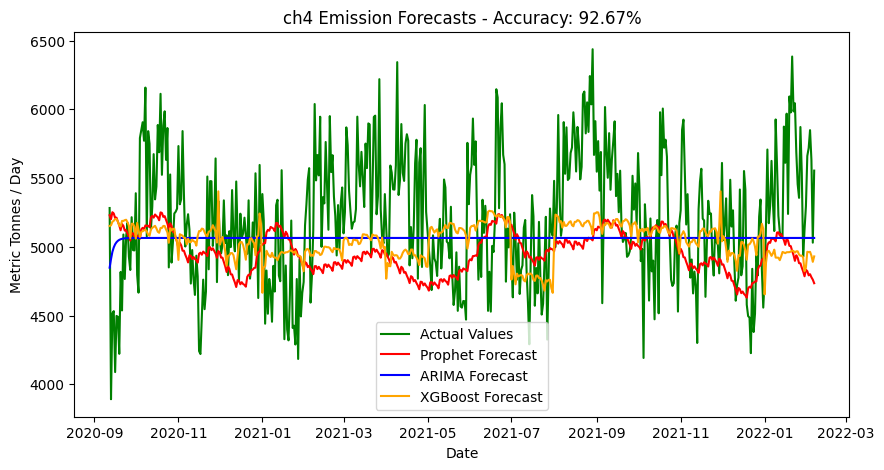

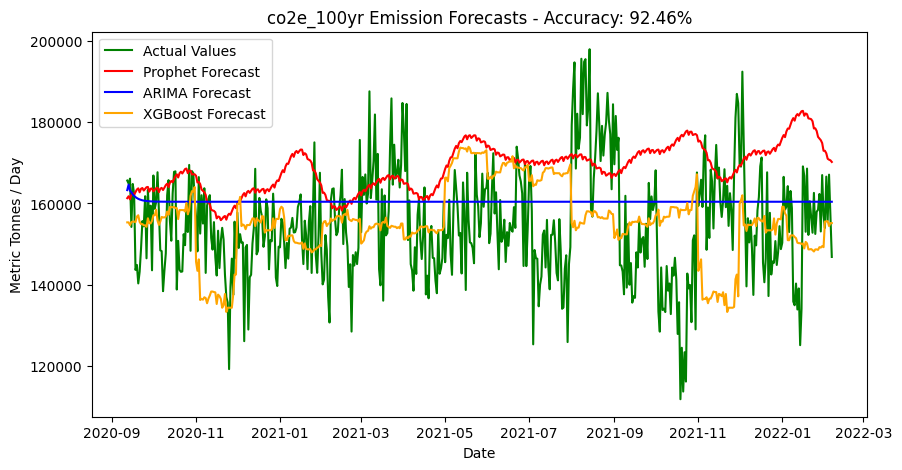

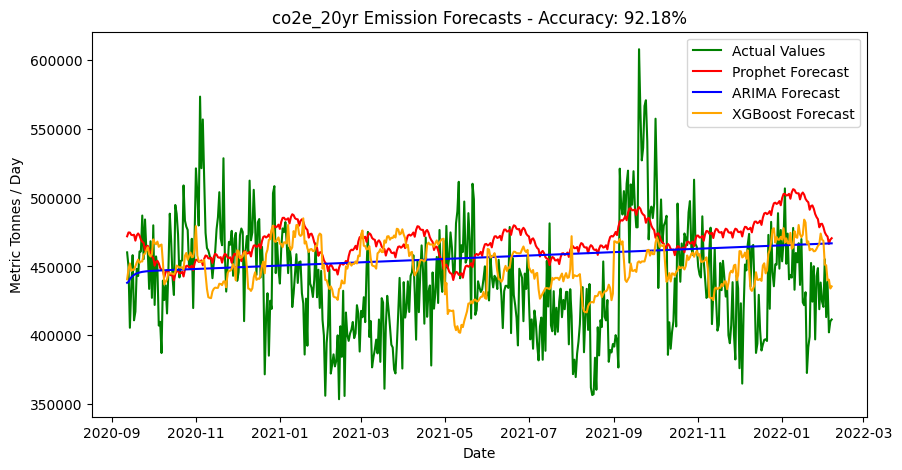

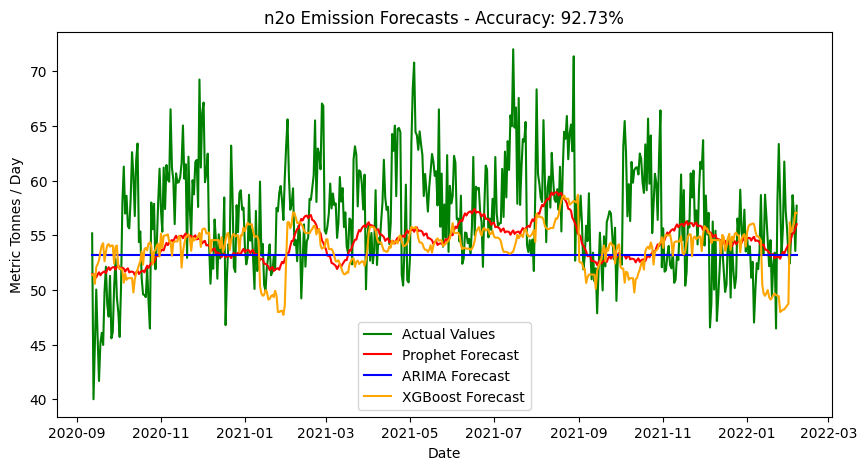

In [16]:
run_comparison(sector_files)

# Custom Model

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import os
from tqdm import tqdm


Processing sector: agriculture


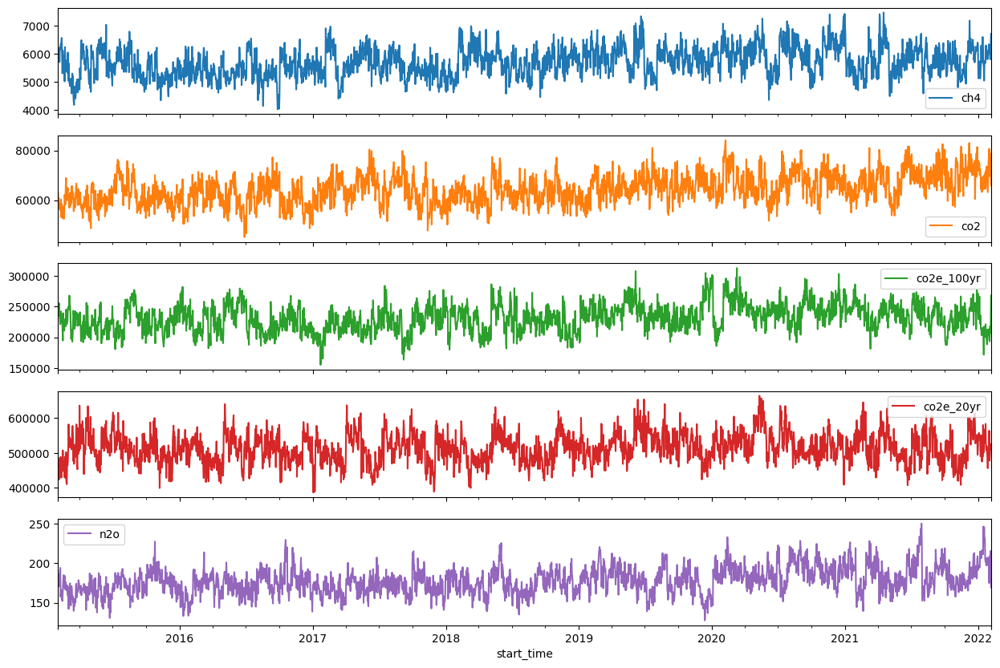


Processing sector: buildings


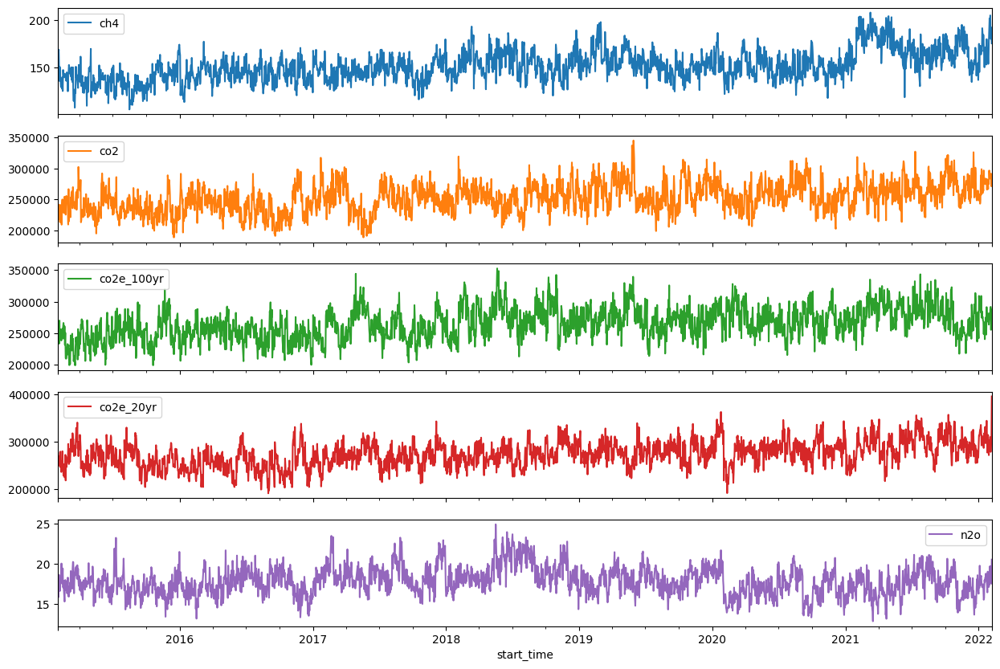


Processing sector: fluorinated_gases


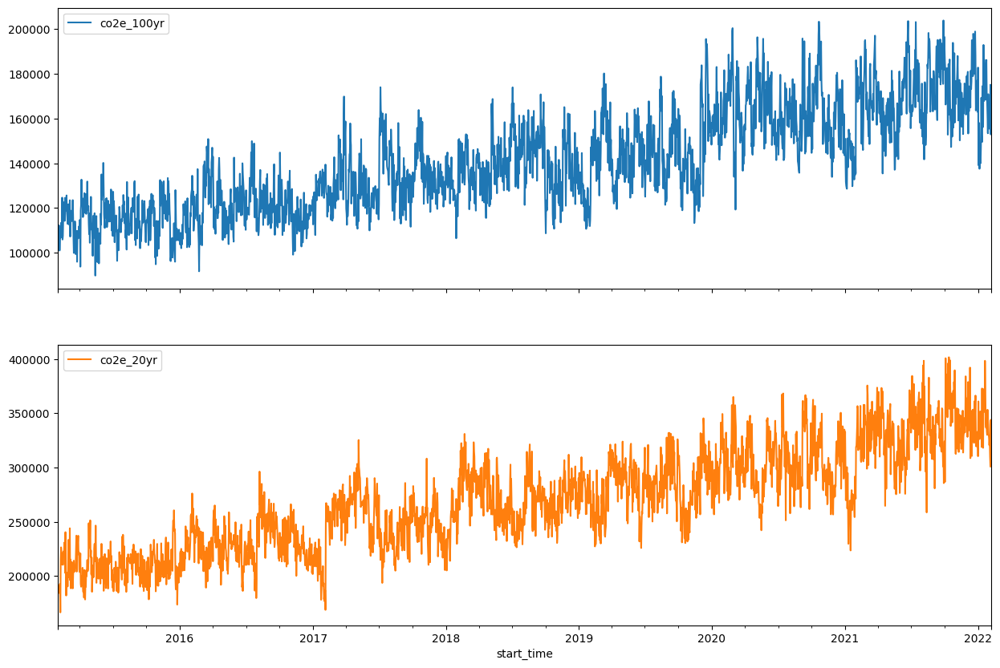


Processing sector: forestry_and_land_use


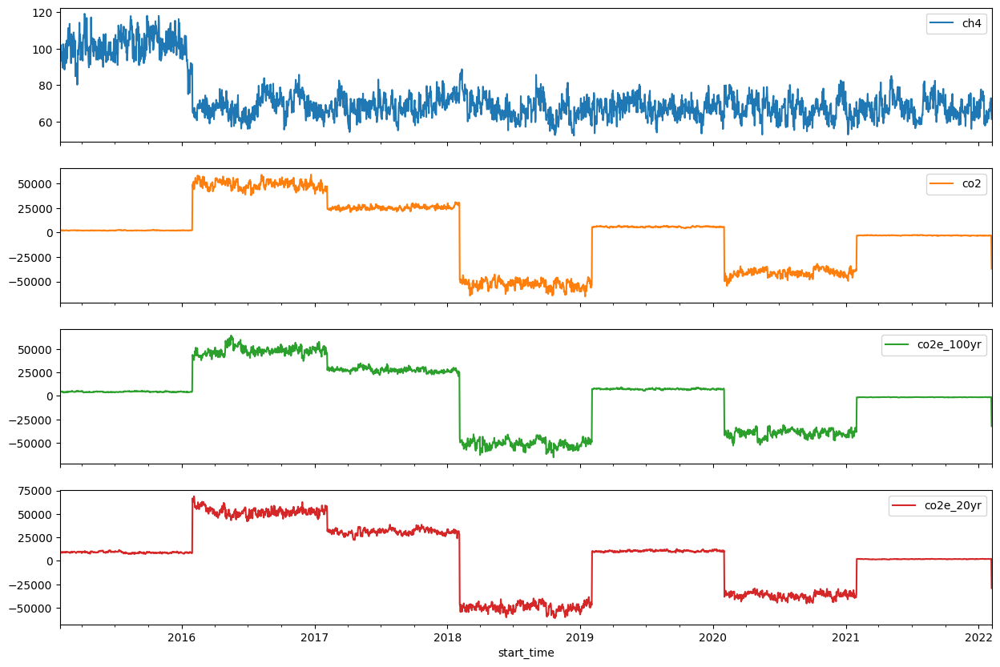


Processing sector: fossil_fuel_operations


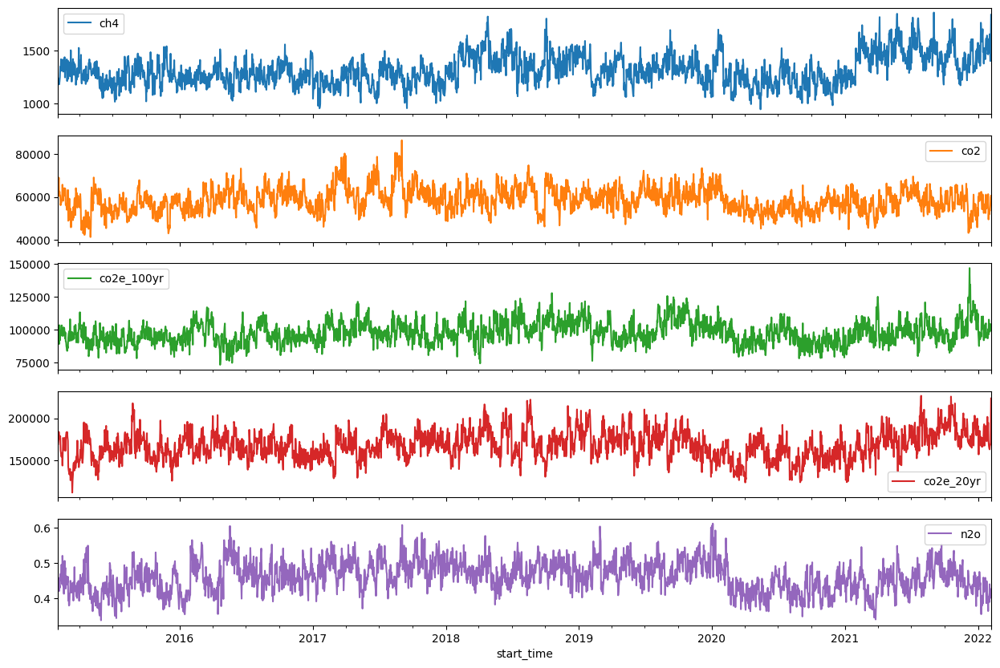


Processing sector: manufacturing


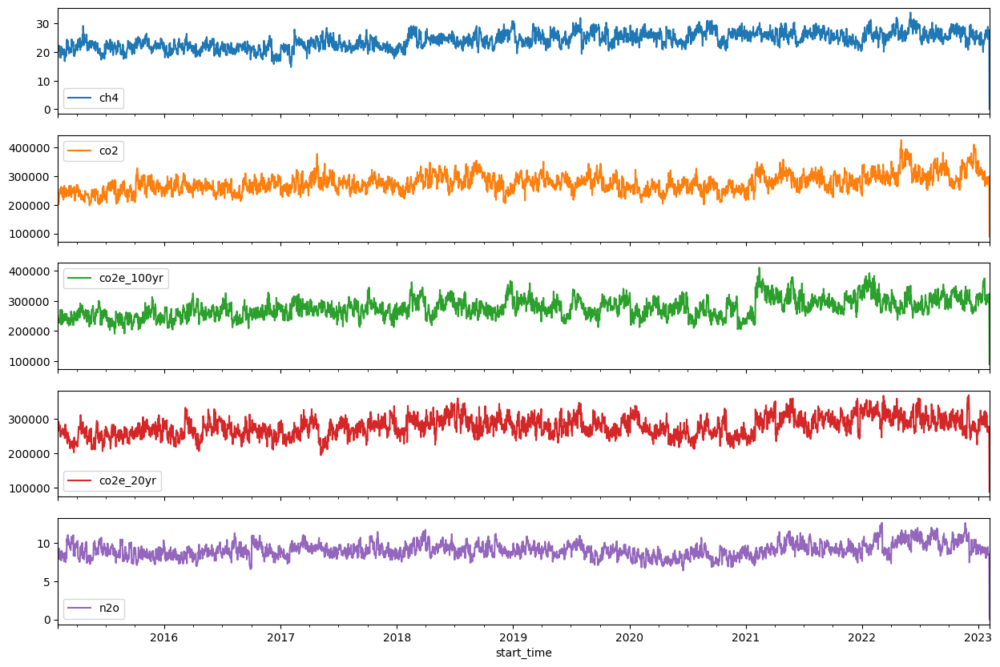


Processing sector: mineral_extraction


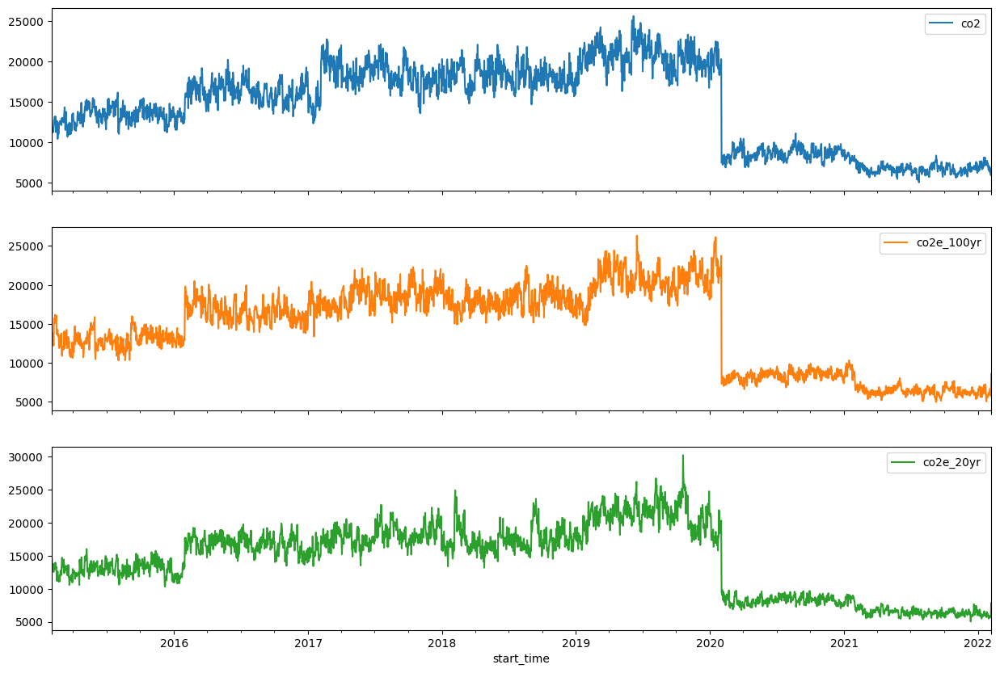


Processing sector: power


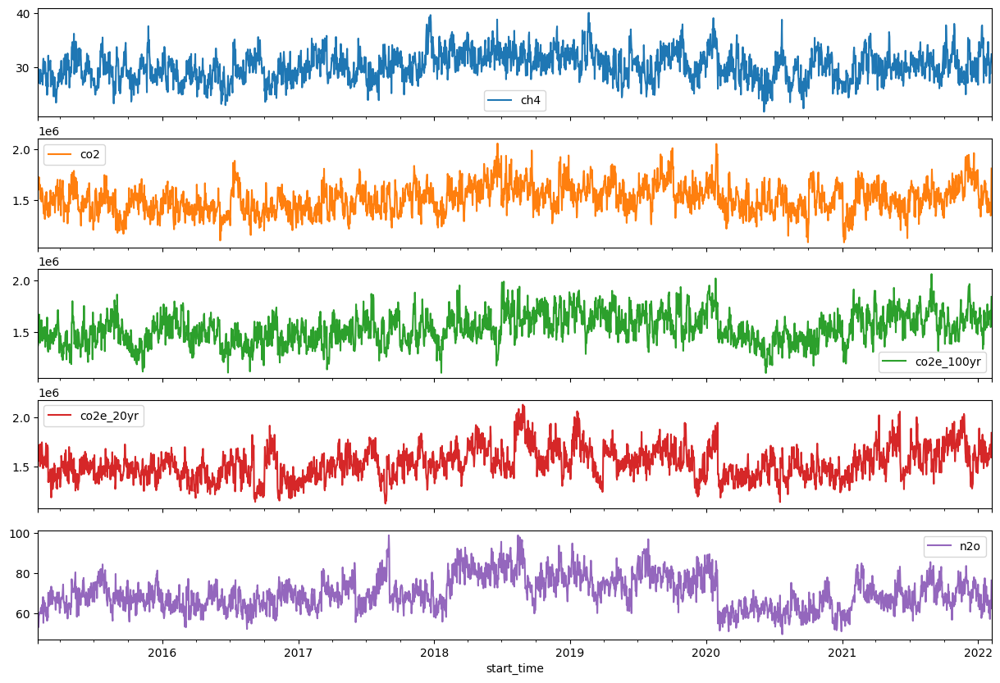


Processing sector: transportation


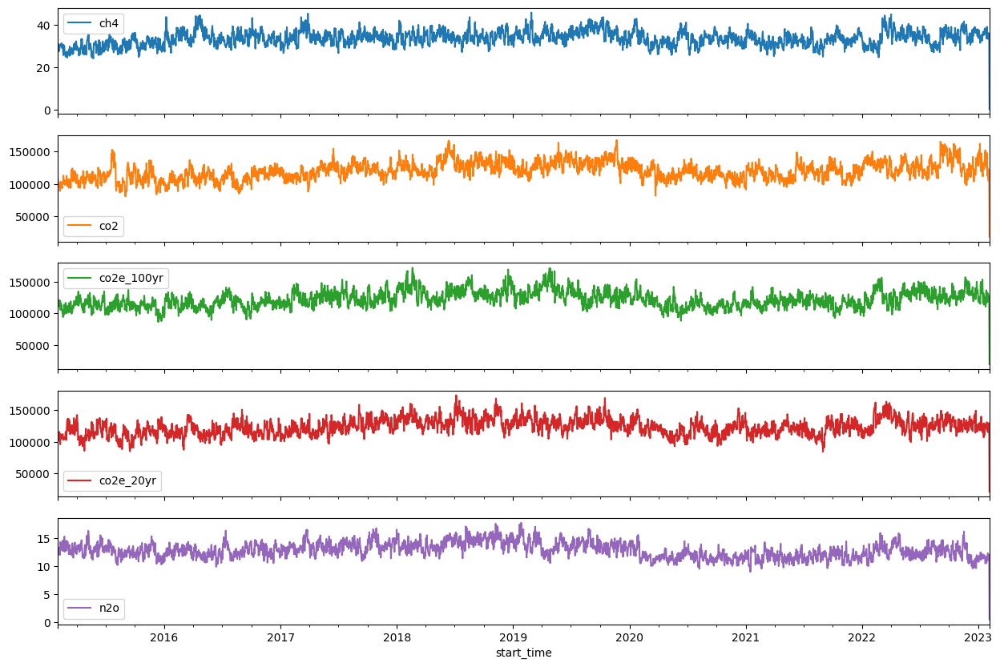


Processing sector: waste


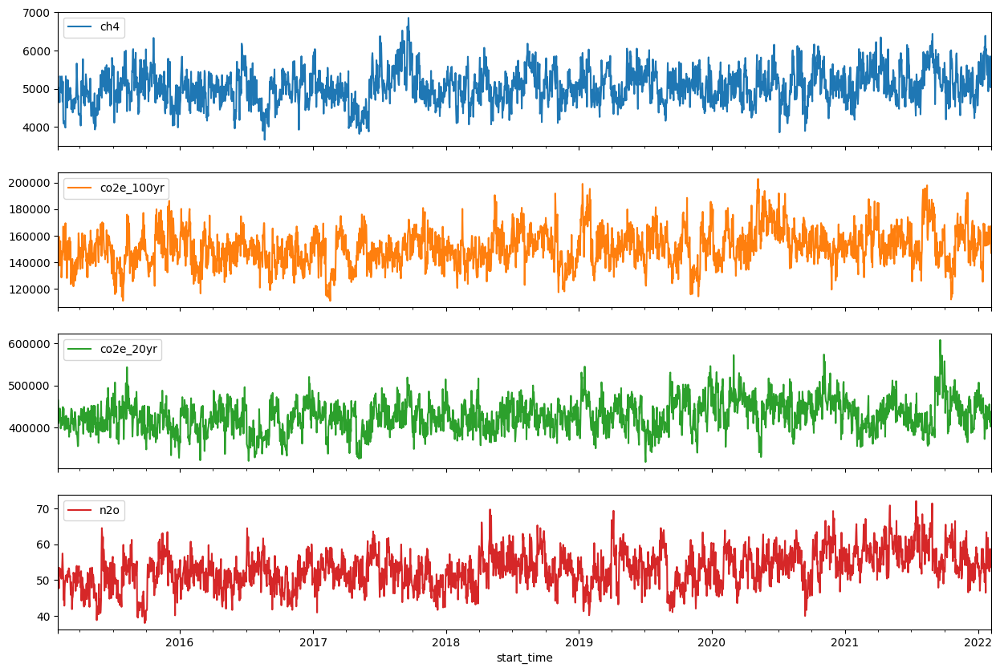

In [4]:
sector_data = {}
for sector, file_path in sector_files.items():
    sector_data[sector] = pd.read_csv(file_path, parse_dates=['start_time'], index_col='start_time')
        
for sector, data in sector_data.items():
    print(f"\nProcessing sector: {sector}")
    
    # Plot the data to visualize trends
    data.plot(subplots=True, figsize=(15, 10))
    plt.show()
        

In [23]:
# Load the dataset
def load_and_preprocess(file_path, target_gas):
    try:
        df = pd.read_csv(file_path)
        if df.nunique().iloc[0] == 0:
            # Column has value '0' in all rows. No reason to process. Continue with rext gas.
            return
        else:
            df['start_time'] = pd.to_datetime(df['start_time'])
            df = df.sort_values('start_time')
            return df[['start_time', target_gas]]
    except Exception as e:
        return

# Split data into train and test
def split_data(df):
    try:
        split_index = int(len(df) * 0.7)
        train = df.iloc[:split_index]
        test = df.iloc[split_index:]
        return train, test
    
    except Exception as e: #Excpetion for when there is no gas data in the CSV
        return

# Prepare data for LSTM
def prepare_lstm_data(data, look_back=30):
    # rescaling feature values, easy peasy model tweezy (effeciency)
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data.values.reshape(-1, 1)) # reshaping the array to fit ALL the data into one column, with as many rows as needed
    X, y = [], []
    for i in range(len(scaled_data) - look_back):
        X.append(scaled_data[i:i+look_back])
        y.append(scaled_data[i+look_back])
    return np.array(X), np.array(y), scaler

# Build and train LSTM model
def train_lstm_model(X_train, y_train):
    model = Sequential([
        LSTM(100, return_sequences=True, input_shape=(X_train.shape[1], 1)),
        Dropout(0.2),
        LSTM(100, return_sequences=True),
        Dropout(0.2),
        LSTM(50),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    #model.summary()
    
    # init earlystopping
    
    erlystp = EarlyStopping(monitor='loss', patience=5,restore_best_weights = True)
    
    model.fit(X_train, y_train, epochs=50, batch_size=32, callbacks=[erlystp],verbose=2)
    return model

# Forecast emissions and evaluate model
def forecast_and_plot(model, X_test, y_test, scaler, train, test, target_gas, sec):
    y_pred = model.predict(X_test)
    y_pred = scaler.inverse_transform(y_pred)
    y_test = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate accuracy metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    accuracy = (1 - (mae / np.mean(y_test))) * 100  # Accuracy as a percentage
    
    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
    print(f'R-Squared (R2): {r2}')
    print(f'Accuracy: {accuracy:.2f}%')
    
    plt.figure(figsize=(10,5))
    #plt.plot(train['start_time'], train[target_gas], label='Training Data')
    plt.plot(test['start_time'][-len(y_test):], y_test, label='Actual Test Data', color='green')
    plt.plot(test['start_time'][-len(y_pred):], y_pred, label='Forecast', color='red')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel(f'{target_gas} Emissions / Metric Tonnes')
    plt.title(f'Forecasting {target_gas} Emissions using LSTM, Accuracy: {accuracy: .2f}%')
    #quick check to ensure the directory exists
    os.makedirs(f'Models/{sec}', exist_ok=True)
    plt.savefig(f'Models/{sec}/{target_gas}_evaluation_plot.png')
    plt.show()

In [24]:
def lstm_train(sector_data):
    
    '''
    Parameters:
    Dictionary containing sector name and corresponding emissions CSV path
    
    Returns nothing
    '''
    cols = ['ch4', 'co2', 'co2e_100yr', 'co2e_20yr', 'n2o'] 

    for sec, f_path in tqdm(sector_data.items(), desc="Processing"):
        print(f"\nProcessing sector: {sec}\n")
        
        # iterating through the gases; training a model for every gas
        for target_gas in cols:
            print(f"\n\tProcessing gas: {target_gas}")
            try:
                df = load_and_preprocess(f_path, target_gas)
    
                train, test = split_data(df)
                # LSTMs do not understand dates so we ain't passing it to them; there is no reason to anyways. The problem is
                # a forecasting emission values on not a predicting the dates one.
                X_train, y_train, scaler = prepare_lstm_data(train[target_gas])
                X_test, y_test, _ = prepare_lstm_data(test[target_gas])
    
                model = train_lstm_model(X_train, y_train)
                model.save(f"C:/Users/jaish/OneDrive/Desktop/Stuff/College/Capstone_Project/Codespace/Models/{sec}/{target_gas}.h5")
                forecast_and_plot(model, X_test, y_test, scaler, train, test, target_gas, sec)
            except Exception as e:
                continue 
        
    return

In [ ]:
sector_files

Processing:   0%|                                                                               | 0/10 [00:00<?, ?it/s]


Processing sector: agriculture


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0307 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0189 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0182 - 981ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0165 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0158 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0155 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0147 - 1s/epoch - 19ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0141 - 978ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0132 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0131 - 1s/epoch - 19ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0132 - 1s/epoch - 19ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0135 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.

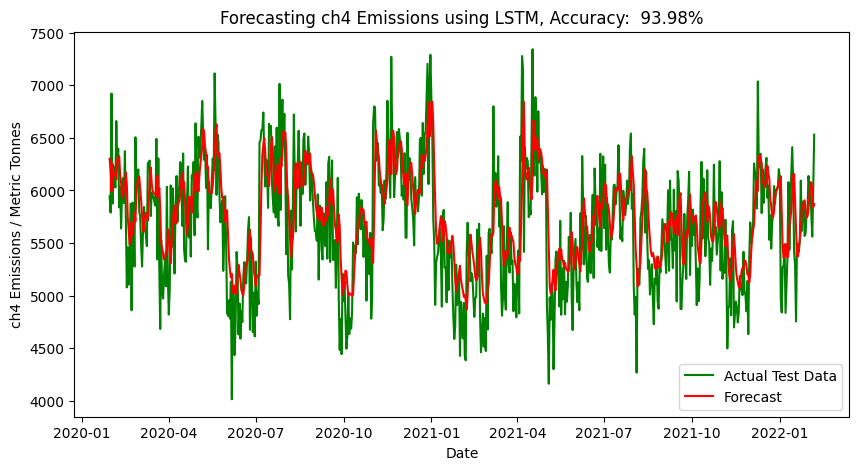


	Processing gas: co2
Epoch 1/50
56/56 - 4s - loss: 0.0318 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0193 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0190 - 975ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0180 - 997ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0173 - 979ms/epoch - 17ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0165 - 996ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0164 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0154 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0149 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0146 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0143 - 944ms/epoch - 17ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0145 - 995ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0143 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0143 - 1s/epoch - 18m

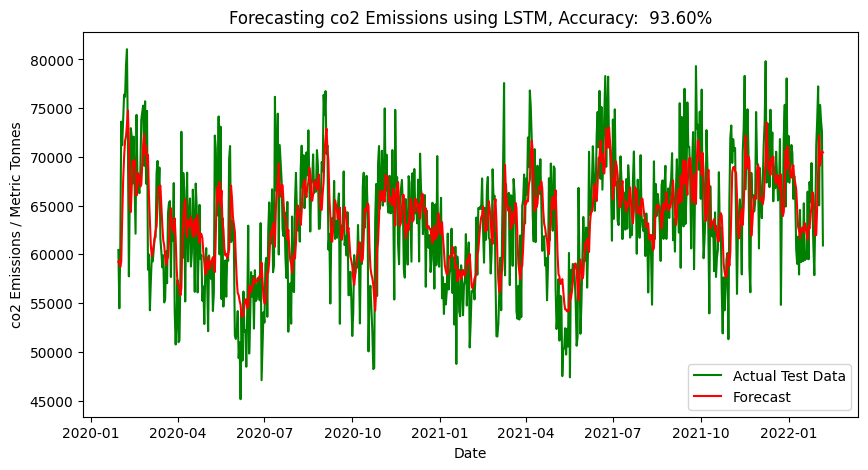


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0301 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0161 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0156 - 976ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0153 - 978ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0150 - 985ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0142 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0133 - 995ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0127 - 996ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0120 - 995ms/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0121 - 969ms/epoch - 17ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0120 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0113 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0114 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0115 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0113 - 1s/e

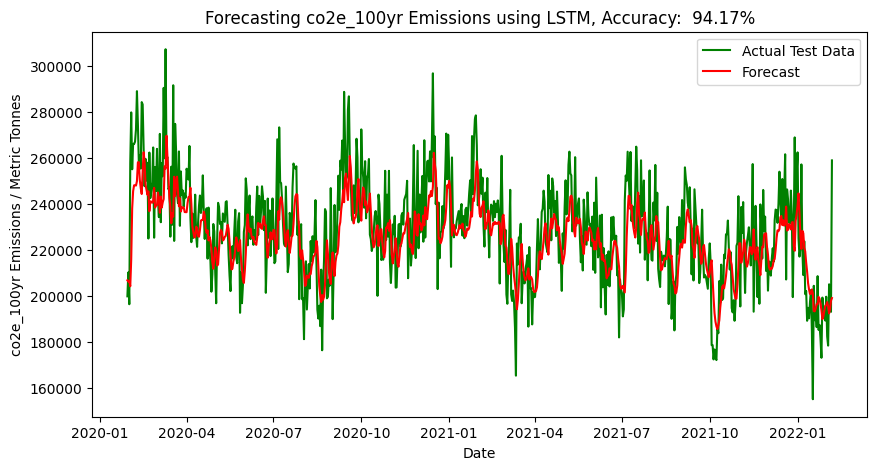


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0327 - 4s/epoch - 72ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0209 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0207 - 1s/epoch - 19ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0198 - 1s/epoch - 19ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0191 - 1s/epoch - 19ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0184 - 954ms/epoch - 17ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0174 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0166 - 1s/epoch - 19ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0170 - 1s/epoch - 19ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 19ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0166 - 1s/epoch - 19ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0159 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0157 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0157 - 1s/epoch - 18ms/step
Ep

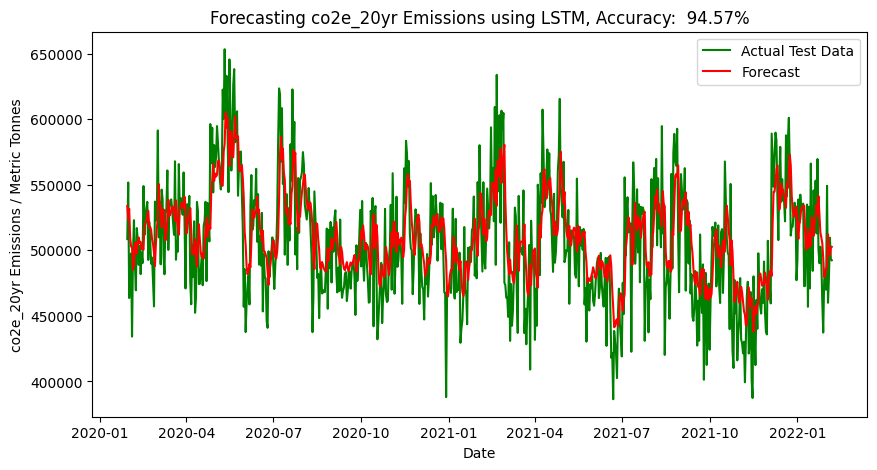


	Processing gas: n2o
Epoch 1/50
56/56 - 4s - loss: 0.0258 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0184 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0179 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0164 - 978ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0157 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0136 - 979ms/epoch - 17ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0130 - 997ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0130 - 973ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0130 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0127 - 999ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0128 - 999ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0125 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0127 - 982ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0129 - 999ms/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0125 - 1s/epoch

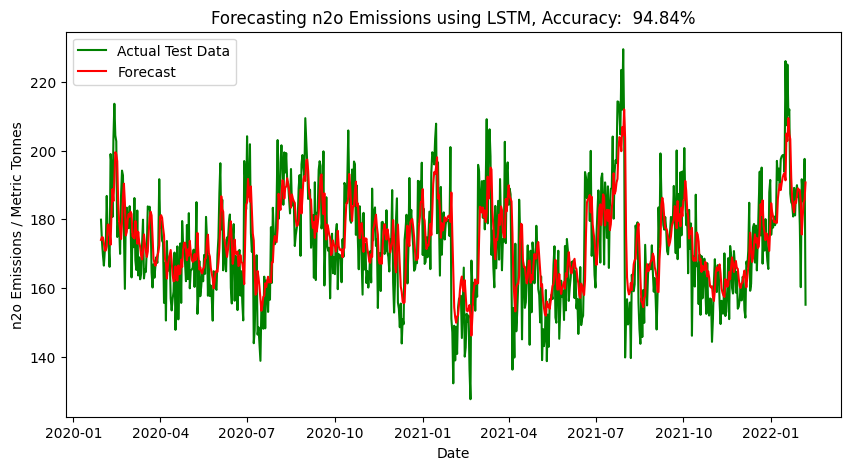

Processing:  10%|███████                                                               | 1/10 [02:40<24:06, 160.76s/it]


Processing sector: buildings


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0257 - 4s/epoch - 73ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0156 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0150 - 992ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0145 - 968ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0140 - 993ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0131 - 1000ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0132 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0122 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0120 - 990ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0121 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0122 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0116 - 989ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0119 - 994ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0112 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0114 - 972ms/epoch - 17ms/step
Epoch 16/50
56/5

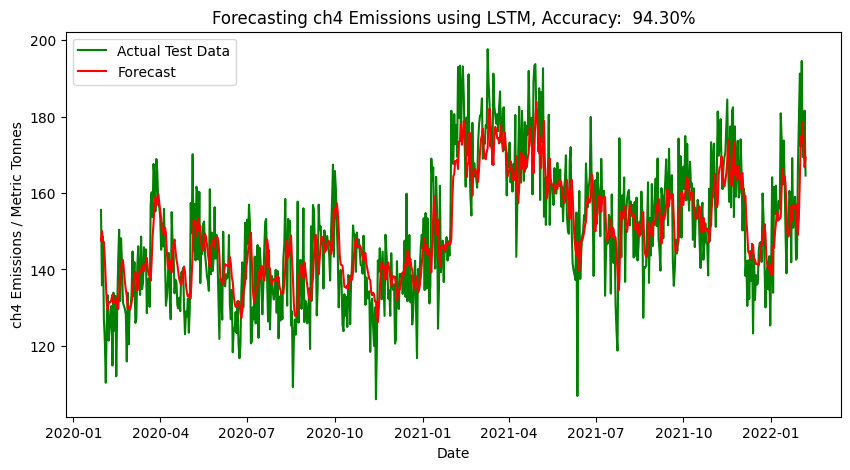


	Processing gas: co2
Epoch 1/50
56/56 - 4s - loss: 0.0234 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0165 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0154 - 976ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0142 - 988ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0134 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0127 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0129 - 999ms/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0121 - 947ms/epoch - 17ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0121 - 980ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0120 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0120 - 999ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0119 - 995ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0119 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0116 - 990ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0119 - 995ms/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0117 - 1s/ep

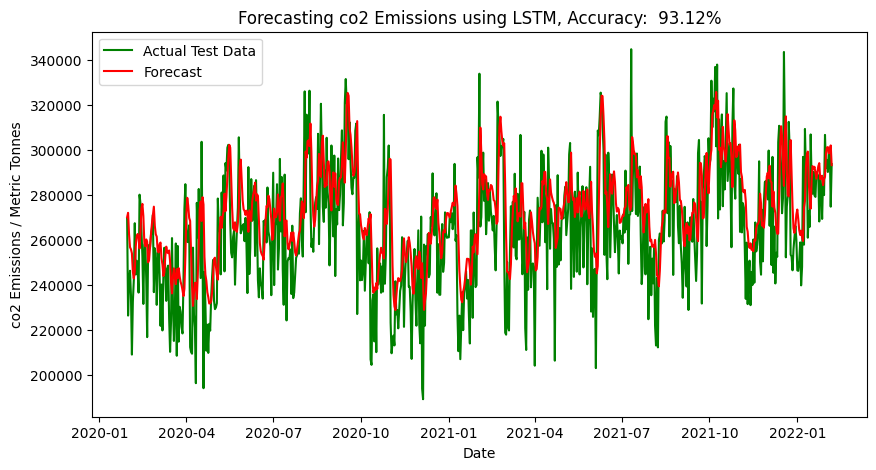


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0270 - 4s/epoch - 67ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0184 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0181 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0174 - 982ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0164 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0158 - 997ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0145 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0154 - 987ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0137 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0138 - 999ms/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0136 - 917ms/epoch - 16ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0137 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0137 - 997ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0138 - 965ms/epoch - 17ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0134 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0134 - 1s/e

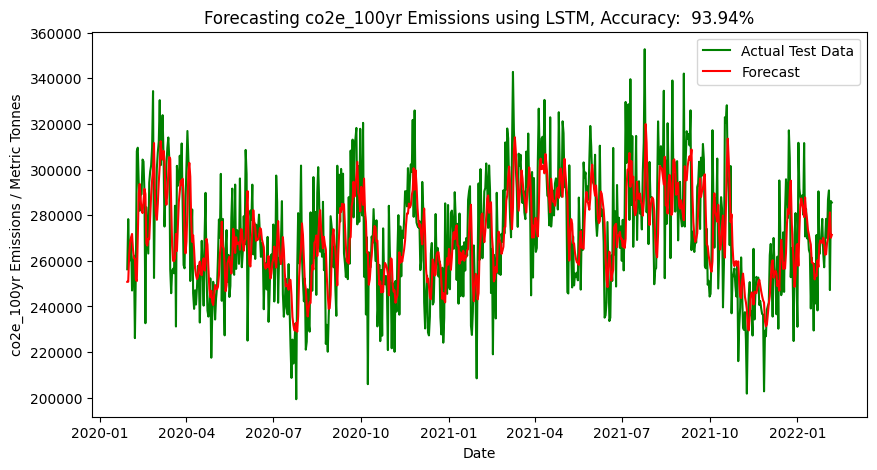


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0348 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0223 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0206 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0198 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0185 - 999ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0178 - 998ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0176 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0168 - 1s/epoch - 19ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0162 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0158 - 964ms/epoch - 17ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0158 - 992ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0155 - 983ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0155 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 

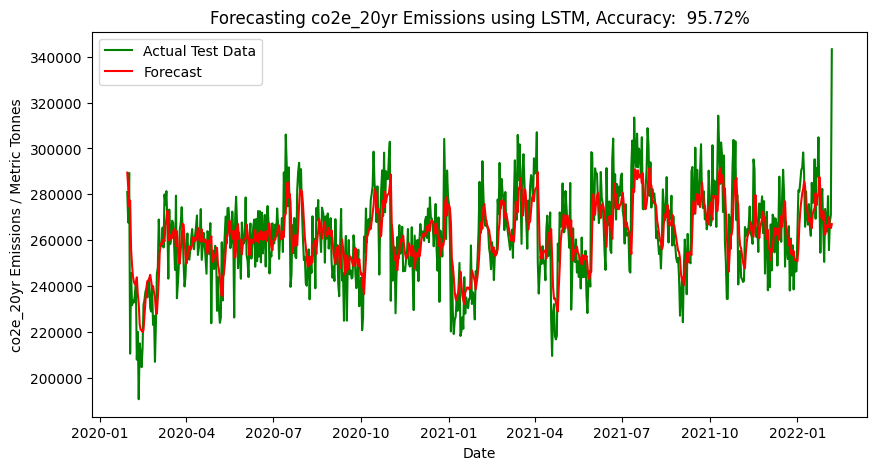


	Processing gas: n2o
Epoch 1/50
56/56 - 4s - loss: 0.0246 - 4s/epoch - 70ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0142 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0137 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0123 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0113 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0114 - 987ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0107 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0106 - 996ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0105 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0107 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0107 - 1s/epoch - 18ms/step
Epoch

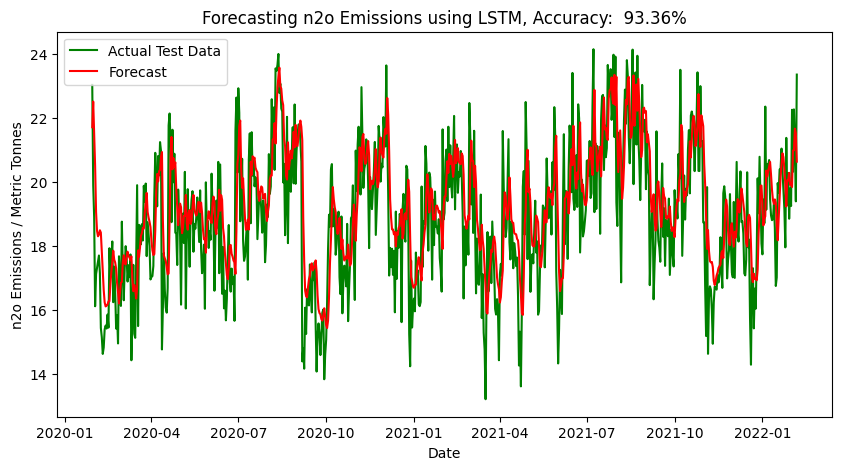

Processing:  20%|██████████████                                                        | 2/10 [05:18<21:12, 159.06s/it]


Processing sector: fluorinated_gases


	Processing gas: ch4

	Processing gas: co2

	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0204 - 4s/epoch - 67ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0125 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0130 - 1s/epoch - 19ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0107 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0098 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0095 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 19ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0088 - 999ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0087 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0084 - 940ms/epoch - 17ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0081 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0085 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0082 - 996ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0

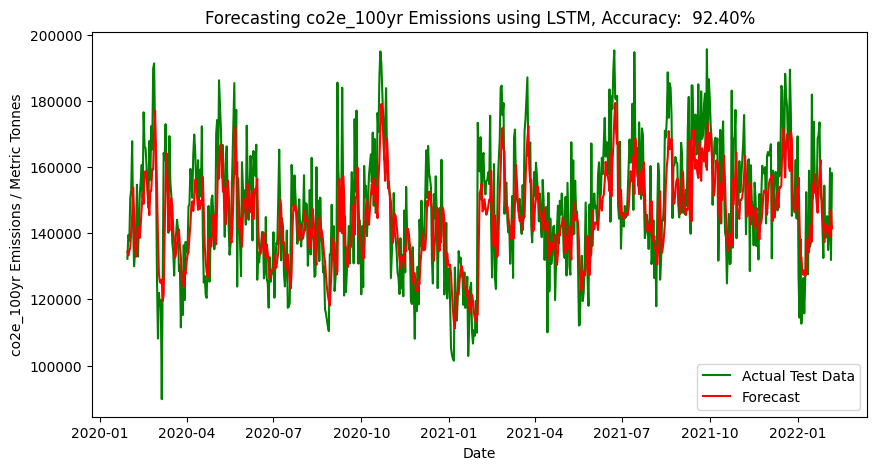


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0221 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0127 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0115 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0113 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0107 - 945ms/epoch - 17ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0103 - 990ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0102 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0094 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0093 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0098 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0092 - 983ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0088 - 986ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0088 - 1s/epoch - 19ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0087 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 18m

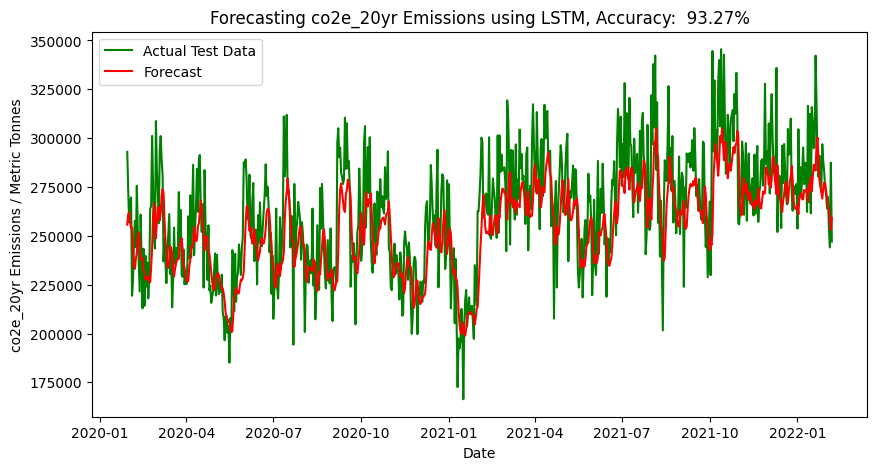

Processing:  30%|█████████████████████                                                 | 3/10 [06:24<13:36, 116.62s/it]


	Processing gas: n2o

Processing sector: forestry_and_land_use


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0132 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0082 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0082 - 997ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0080 - 973ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0075 - 1s/epoch - 19ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0071 - 989ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0073 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0070 - 994ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0066 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0066 - 973ms/epoch - 17ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0062 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0068 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0058 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0058 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0060 - 1s/epoch - 18

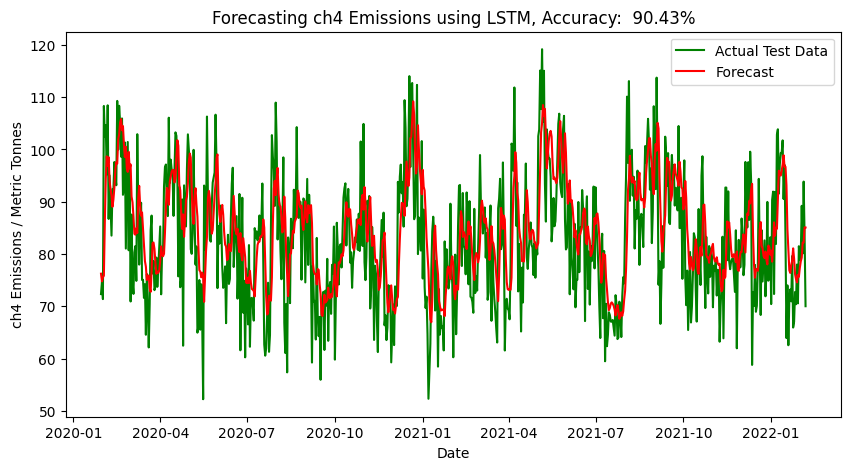


	Processing gas: co2
Epoch 1/50
56/56 - 4s - loss: 0.0210 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0043 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0042 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0048 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0039 - 998ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0037 - 954ms/epoch - 17ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0035 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0030 - 1s/epoch - 19ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0031 - 989ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0031 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0028 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0026 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0027 - 1s/epoch - 19ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0025 - 1s/epoch - 20ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0023 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0024 - 971ms/epoch - 17ms/step

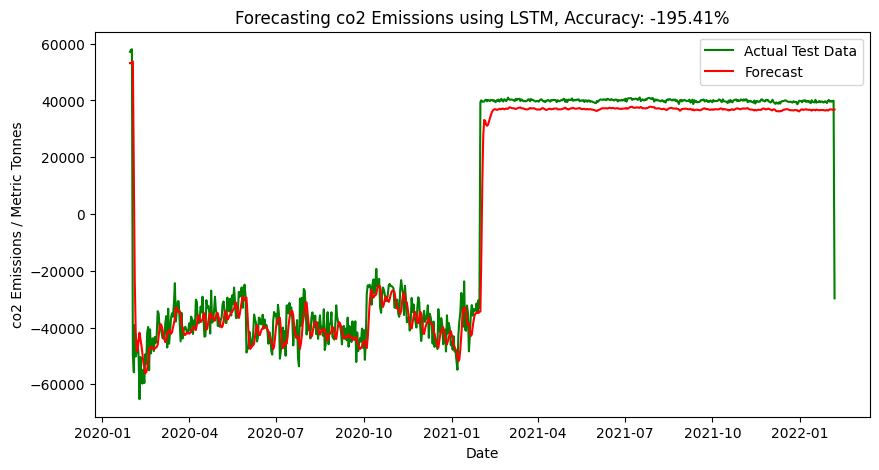


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0269 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0038 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0036 - 1s/epoch - 19ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0033 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0031 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0028 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0027 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0026 - 987ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0026 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0026 - 995ms/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0022 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0021 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0030 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0020 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0020 - 1000ms/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0021 - 1s/epoch - 18ms

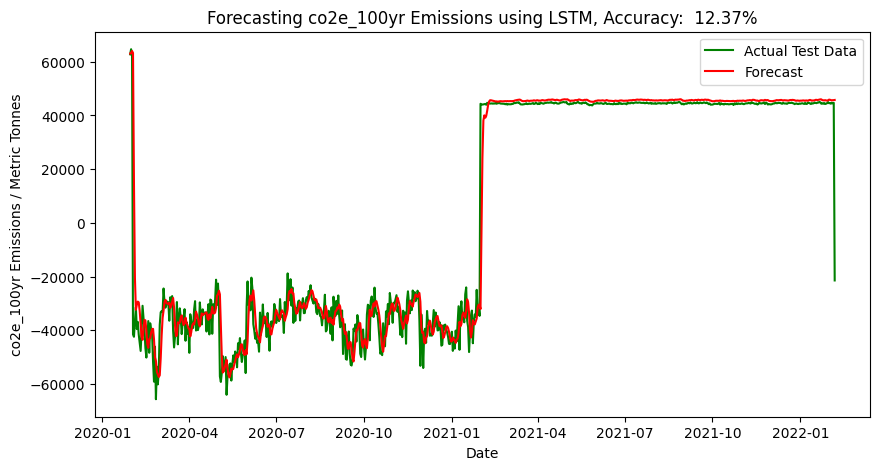


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0300 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0042 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0038 - 1s/epoch - 19ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0037 - 982ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0034 - 996ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0032 - 993ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0032 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0033 - 980ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0028 - 944ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0030 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0027 - 984ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0026 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0025 - 999ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0024 - 1s/epoch - 20ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0023 - 961ms/epoch - 17ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0022 - 1s

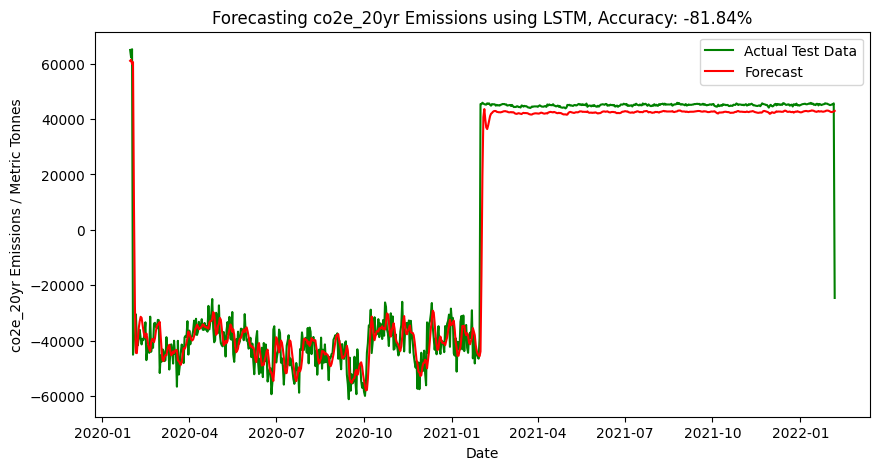

Processing:  40%|████████████████████████████                                          | 4/10 [09:28<14:18, 143.05s/it]


	Processing gas: n2o

Processing sector: fossil_fuel_operations


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0250 - 4s/epoch - 75ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0145 - 961ms/epoch - 17ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 19ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0141 - 994ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0120 - 996ms/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0115 - 934ms/epoch - 17ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0112 - 993ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0108 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0108 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0107 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0106 - 988ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0106 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0107 - 976ms/epo

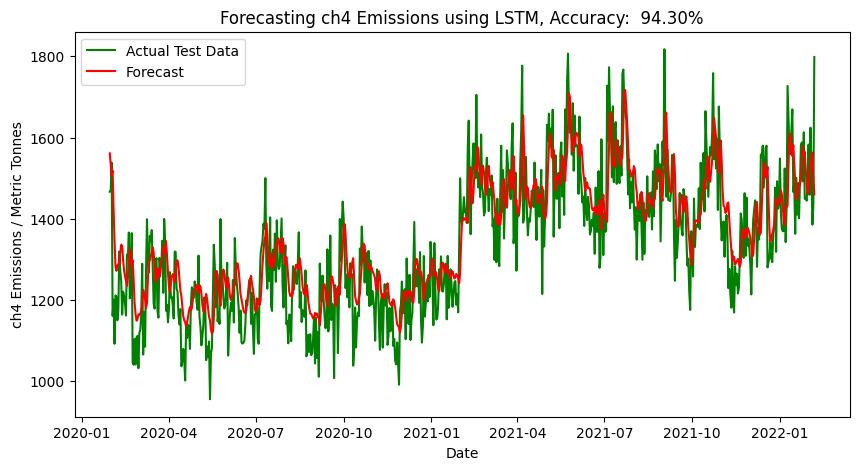


	Processing gas: co2
Epoch 1/50
56/56 - 5s - loss: 0.0206 - 5s/epoch - 83ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0128 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0127 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0115 - 1s/epoch - 20ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0118 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0108 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0102 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0097 - 1s/epoch - 20ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0099 - 1s/epoch - 20ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0094 - 1s/epoch - 20ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 20ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0089 - 1s/epoch - 20ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0089 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 18ms/step
Epoch 17/50

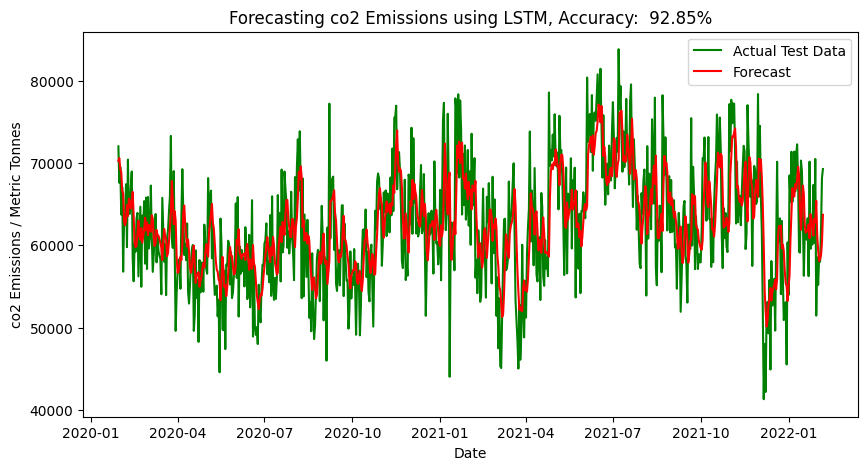


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0297 - 4s/epoch - 70ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0183 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0177 - 992ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0179 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0168 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0163 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0151 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0149 - 964ms/epoch - 17ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0144 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0136 - 998ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0137 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0133 - 992ms/epoch - 18

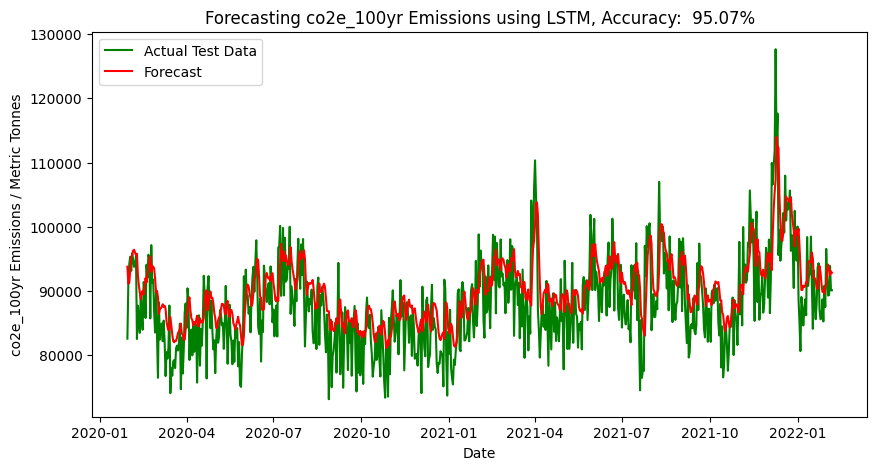


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0296 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0168 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0164 - 981ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0155 - 995ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0147 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0132 - 993ms/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0127 - 987ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0125 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0117 - 977ms/epoch - 17ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0117 - 994ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0117 - 918ms/epoch - 16ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0114 - 992ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0121 - 946ms/epoch - 17ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0123 - 932ms/epoch - 17ms/step
Epoch 16/50
56/56 - 1s - loss: 0.011

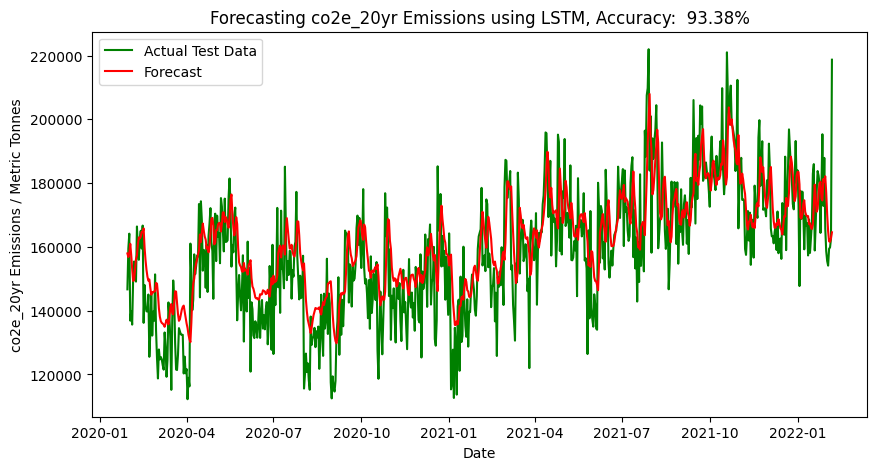


	Processing gas: n2o
Epoch 1/50
56/56 - 4s - loss: 0.0272 - 4s/epoch - 79ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0187 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0176 - 967ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0170 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0148 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0142 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0136 - 970ms/epoch - 17ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0140 - 988ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0137 - 996ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0139 - 993ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0131 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0134 - 977ms/epoch - 17ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0137 - 1s/epoch - 18m

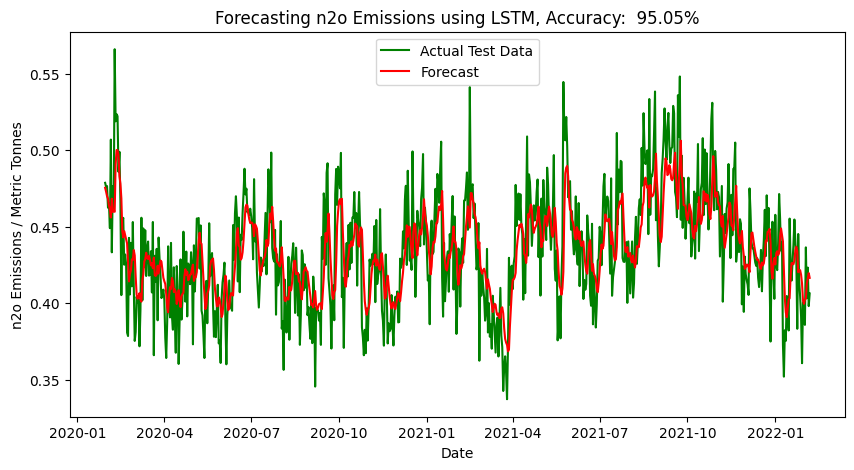

Processing:  50%|███████████████████████████████████                                   | 5/10 [12:01<12:13, 146.68s/it]


Processing sector: manufacturing


	Processing gas: ch4
Epoch 1/50
64/64 - 4s - loss: 0.0264 - 4s/epoch - 62ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0129 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0126 - 1s/epoch - 18ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0129 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0115 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0112 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0099 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0098 - 1s/epoch - 18ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0103 - 1s/epoch - 17ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0099 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0096 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0097 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0093

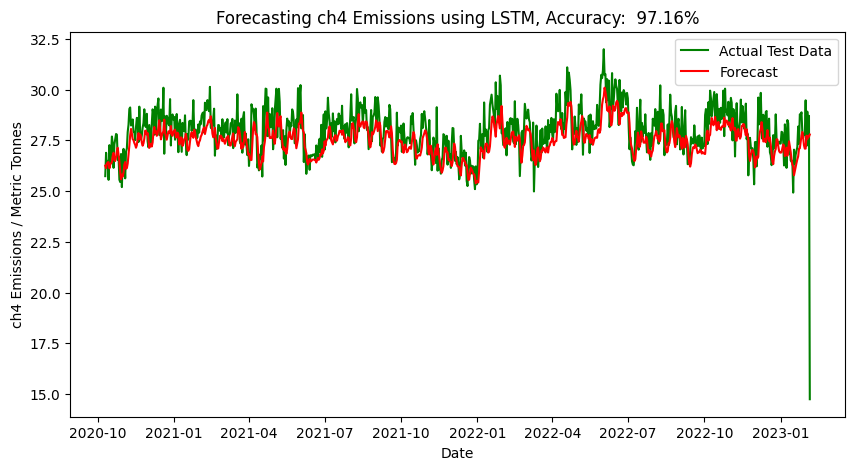


	Processing gas: co2
Epoch 1/50
64/64 - 4s - loss: 0.0214 - 4s/epoch - 62ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0153 - 1s/epoch - 18ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0144 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0133 - 1s/epoch - 18ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0129 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0118 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0114 - 1s/epoch - 19ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0105 - 1s/epoch - 18ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0106 - 1s/epoch - 17ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0107 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0108 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0105 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0106 - 1s/epoch - 18ms/step
Epoch 17/50

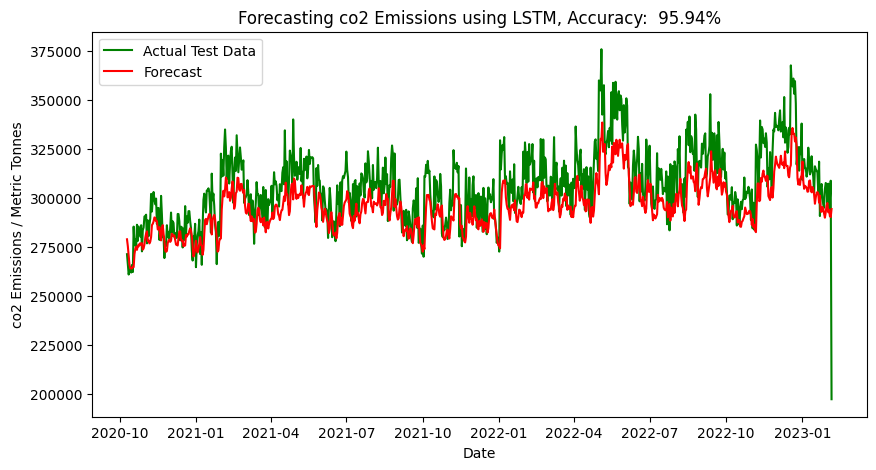


	Processing gas: co2e_100yr
Epoch 1/50
64/64 - 4s - loss: 0.0238 - 4s/epoch - 67ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0162 - 1s/epoch - 17ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0169 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0145 - 1s/epoch - 17ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0141 - 1s/epoch - 17ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0133 - 1s/epoch - 17ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0131 - 1s/epoch - 16ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0125 - 1s/epoch - 16ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0119 - 1s/epoch - 17ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0118 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0114 - 1s/epoch - 19ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0124 - 1s/epoch - 17ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0116 - 1s/epoch - 17ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0111 - 1s/epoch - 16ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0108 - 1s/epoch - 16ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0116 - 1s/epoch - 17ms/step
Epoc

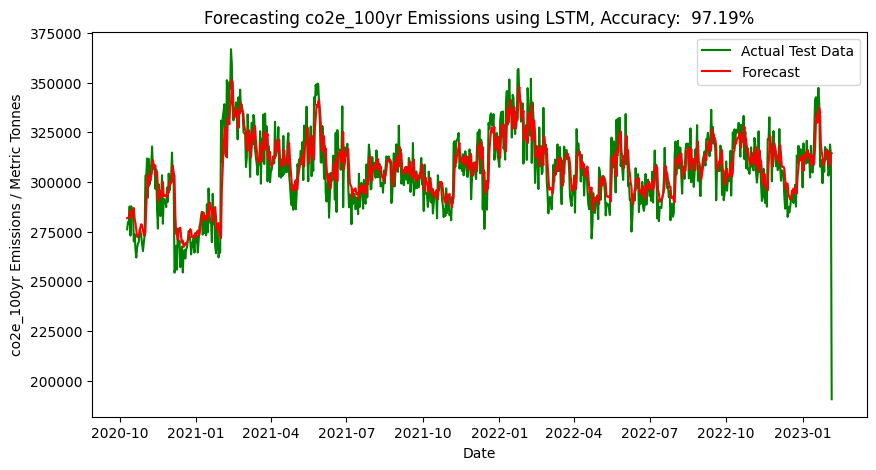


	Processing gas: co2e_20yr
Epoch 1/50
64/64 - 5s - loss: 0.0284 - 5s/epoch - 71ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0178 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0169 - 1s/epoch - 17ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0159 - 1s/epoch - 19ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0156 - 1s/epoch - 19ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0142 - 1s/epoch - 20ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0131 - 1s/epoch - 19ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0131 - 1s/epoch - 20ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0128 - 1s/epoch - 19ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0129 - 1s/epoch - 17ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0125 - 1s/epoch - 17ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0125 - 1s/epoch - 17ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0128 - 1s/epoch - 17ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0127 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0126 - 1s/epoch - 18ms/step
Epoch

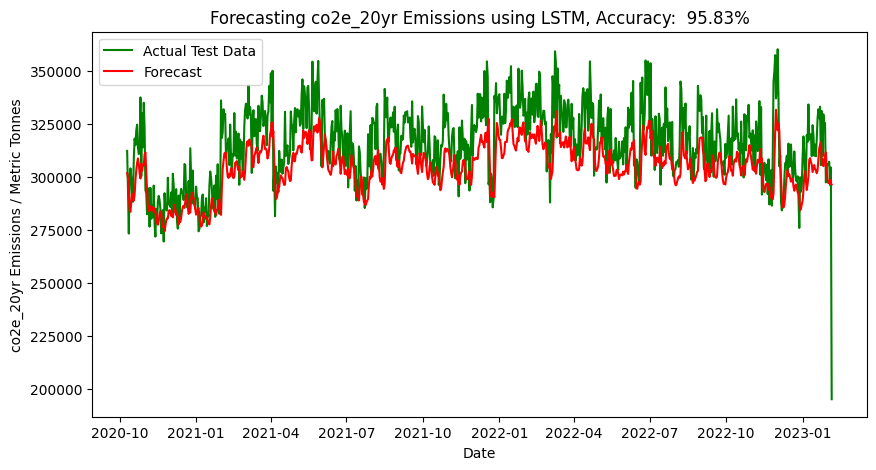


	Processing gas: n2o
Epoch 1/50
64/64 - 4s - loss: 0.0290 - 4s/epoch - 61ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0197 - 1s/epoch - 18ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0191 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0182 - 1s/epoch - 17ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0170 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0162 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0149 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0142 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0139 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0135 - 1s/epoch - 17ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0134 - 1s/epoch - 17ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0137 - 1s/epoch - 17ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0133 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0134 - 1s/epoch - 17ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0134 - 1s/epoch - 18ms/step
Epoch 17/50

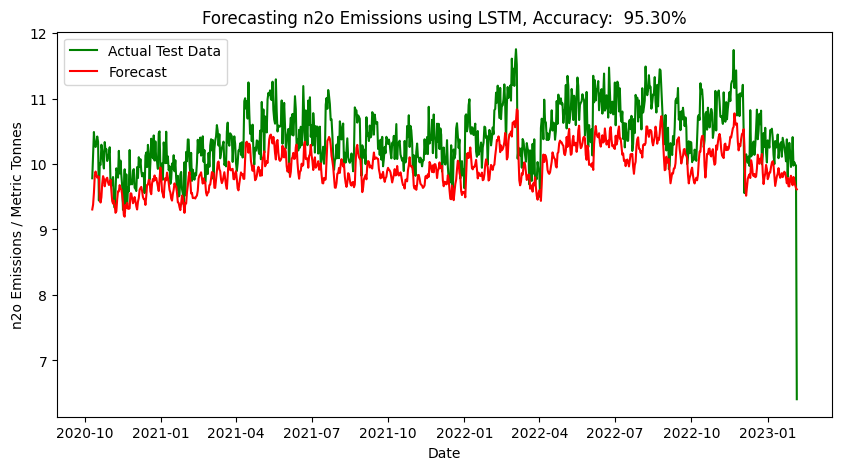

Processing:  60%|██████████████████████████████████████████                            | 6/10 [14:31<09:51, 147.76s/it]


Processing sector: mineral_extraction


	Processing gas: ch4

	Processing gas: co2
Epoch 1/50
56/56 - 4s - loss: 0.0222 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0094 - 998ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0090 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0085 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0077 - 984ms/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0076 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0077 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0075 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0071 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0071 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0070 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0069 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0070 - 1s/epoch - 18ms/step
Epoc

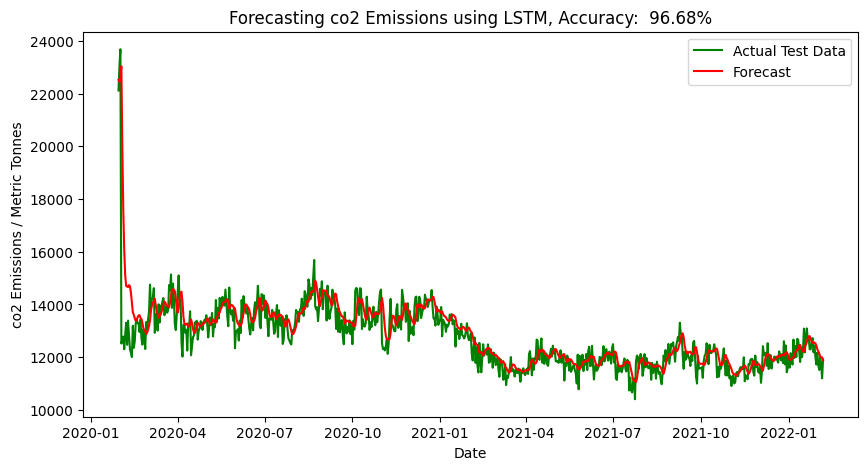


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0194 - 4s/epoch - 72ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0076 - 1s/epoch - 20ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0080 - 971ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0077 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0075 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0071 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0067 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0076 - 989ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0067 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0064 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0063 - 997ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0063 - 982ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0066 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0069 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0060 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0058 - 1s/epoch - 18

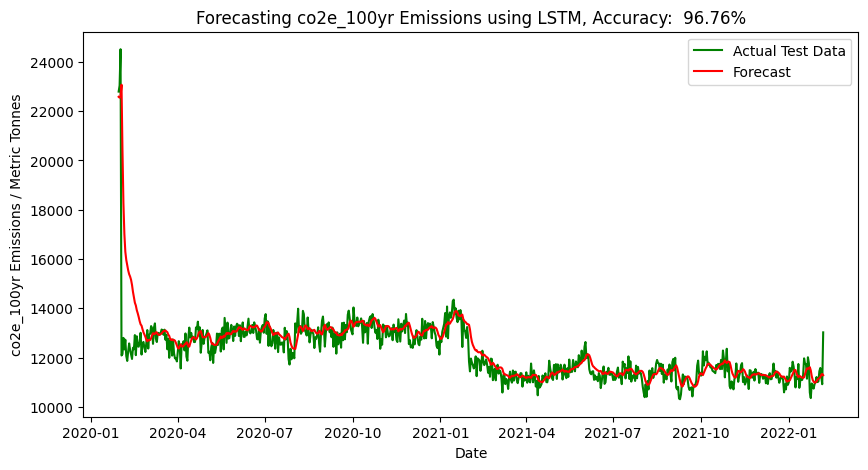


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0132 - 4s/epoch - 70ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0065 - 987ms/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0068 - 984ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0059 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0059 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0052 - 983ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0050 - 987ms/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0048 - 968ms/epoch - 17ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0048 - 979ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0044 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0045 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0042 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0041 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0041 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0043 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0041 - 1s/epoch

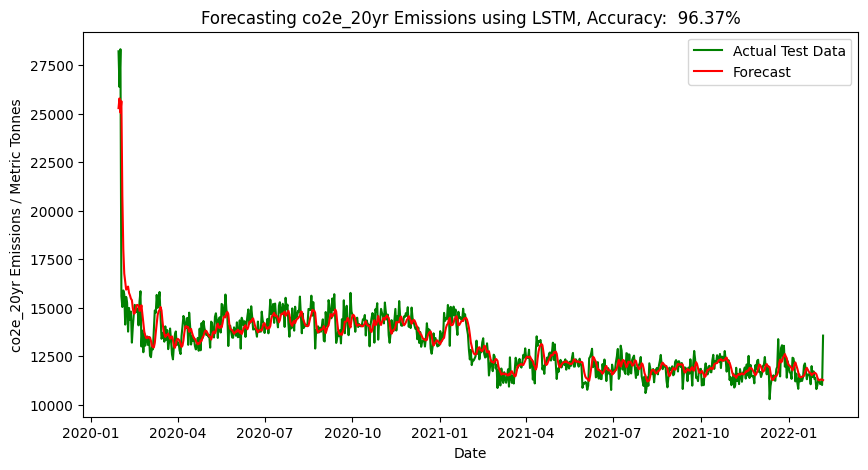

Processing:  70%|█████████████████████████████████████████████████                     | 7/10 [16:12<06:37, 132.47s/it]


	Processing gas: n2o

Processing sector: power


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0291 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0182 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0177 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0169 - 960ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0162 - 994ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0156 - 966ms/epoch - 17ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0143 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0142 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0136 - 972ms/epoch - 17ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0137 - 996ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0135 - 987ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0131 - 1s/epoch - 18ms/step
Epoch

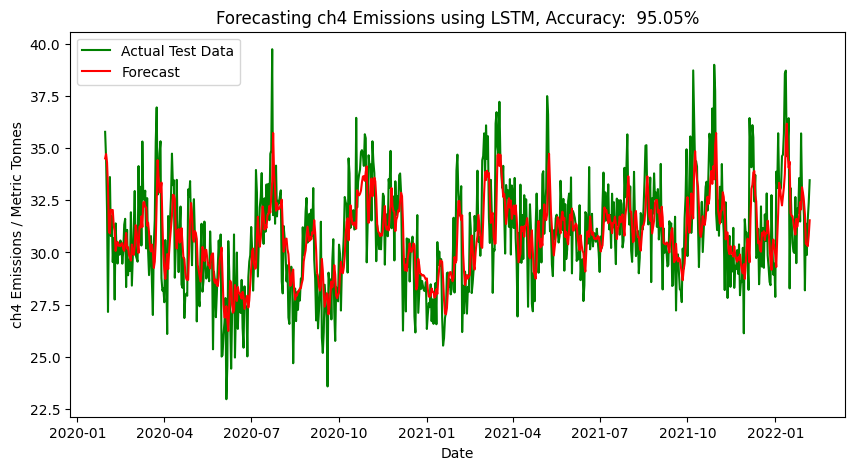


	Processing gas: co2
Epoch 1/50
56/56 - 4s - loss: 0.0274 - 4s/epoch - 69ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0159 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0154 - 970ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0148 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0144 - 985ms/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0144 - 968ms/epoch - 17ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0128 - 993ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0125 - 950ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0122 - 987ms/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0115 - 998ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0121 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0116 - 994ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0114 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0116 - 1s/epoch

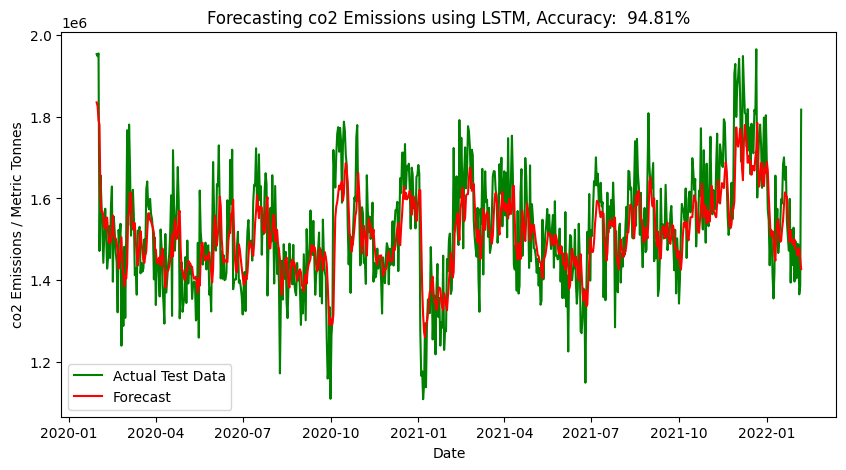


	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0334 - 4s/epoch - 67ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0215 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0209 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0204 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0206 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0186 - 979ms/epoch - 17ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0176 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0166 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0158 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0155 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0151 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0148 - 987ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0146 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0146 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0145 - 1s/epoch - 18ms/ste

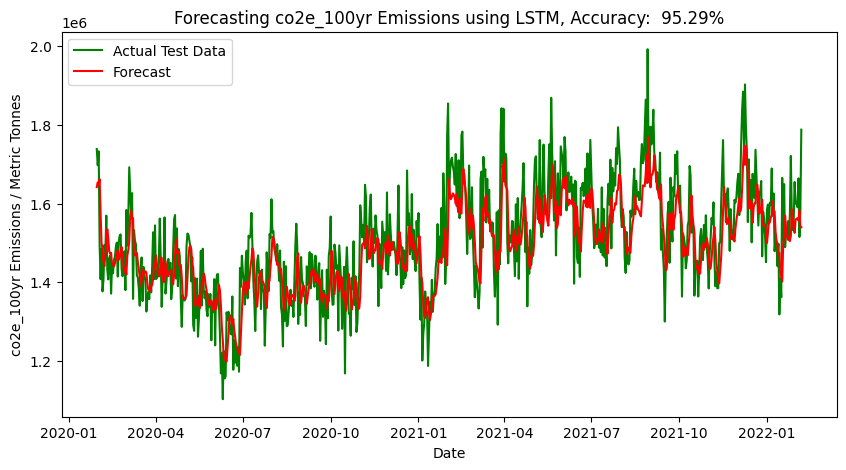


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0259 - 4s/epoch - 72ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0160 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0145 - 997ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0134 - 998ms/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0127 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0125 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0128 - 979ms/epoch - 17ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0116 - 948ms/epoch - 17ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0109 - 979ms/epoch - 17ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0113 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0107 - 994ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0110 - 992ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0108 - 1s/ep

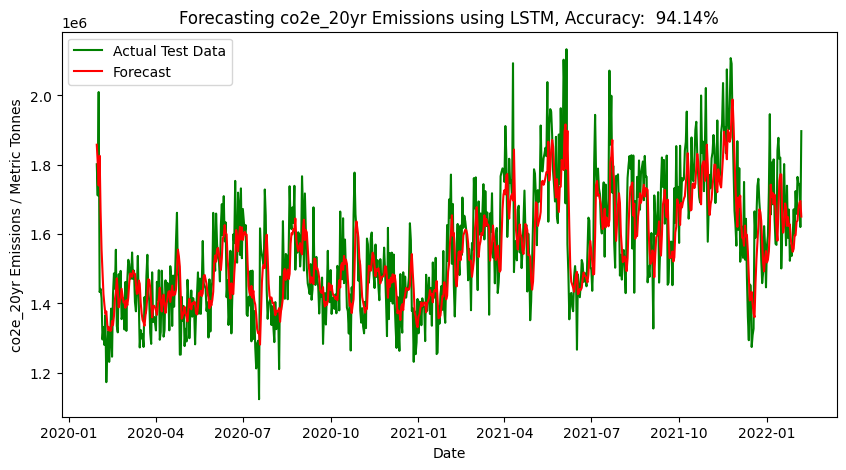


	Processing gas: n2o
Epoch 1/50
56/56 - 4s - loss: 0.0246 - 4s/epoch - 68ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0141 - 990ms/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0146 - 973ms/epoch - 17ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0137 - 933ms/epoch - 17ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0127 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0122 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0120 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0112 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0112 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0112 - 1s/epoch - 19ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0110 - 998ms/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0108 - 1s/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0106 - 982ms/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0108 - 1s/epoch - 19ms/s

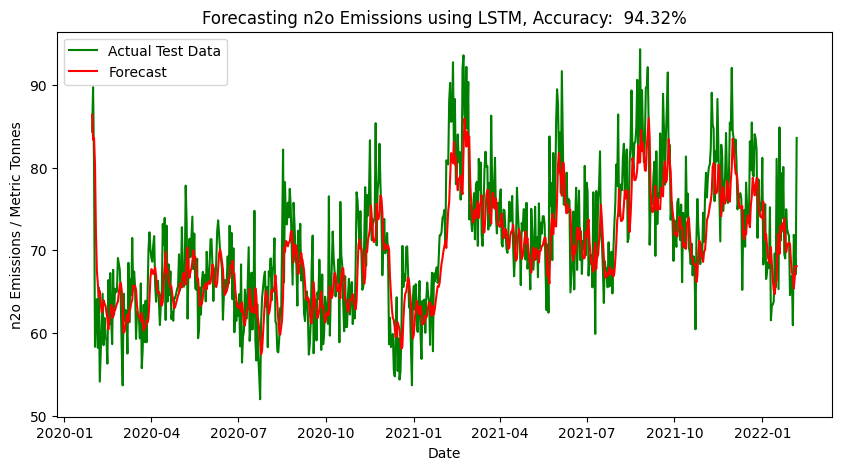

Processing:  80%|████████████████████████████████████████████████████████              | 8/10 [19:09<04:53, 146.76s/it]


Processing sector: transportation


	Processing gas: ch4
Epoch 1/50
64/64 - 4s - loss: 0.0277 - 4s/epoch - 63ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0177 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0169 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0166 - 1s/epoch - 18ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0162 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0134 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0129 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0128 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0120 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0122 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0122 - 1s/epoch - 17ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0123 - 1s/epoch - 18ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0119 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0126 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0119 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.011

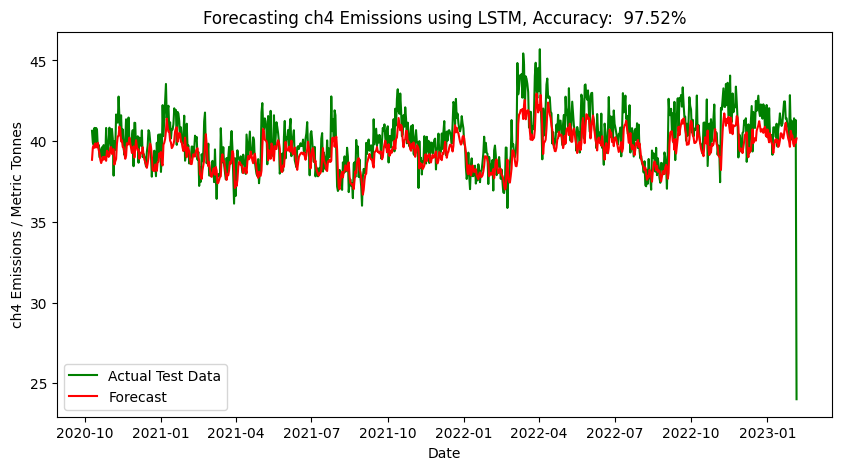


	Processing gas: co2
Epoch 1/50
64/64 - 4s - loss: 0.0219 - 4s/epoch - 63ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0128 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0122 - 1s/epoch - 19ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0118 - 1s/epoch - 18ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0128 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0104 - 1s/epoch - 19ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0099 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0100 - 1s/epoch - 19ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0093 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0094 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0090 - 1s/epoch - 19ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0096 - 1s/epoch - 19ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0088 - 1s/epoch - 19ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0088 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0089 - 1s/epoch - 19ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0090 - 1s/epoch - 18ms/step
Epoch 17/50

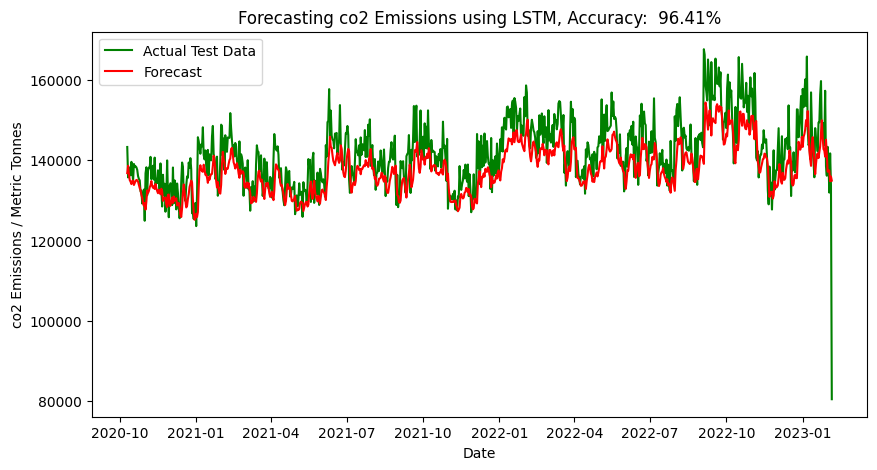


	Processing gas: co2e_100yr
Epoch 1/50
64/64 - 4s - loss: 0.0233 - 4s/epoch - 64ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0135 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0134 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0125 - 1s/epoch - 18ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0120 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0110 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0106 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0100 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0098 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0111 - 1s/epoch - 18ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0095 - 1s/epoch - 18ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0098 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0099 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0096 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0095 - 1s/epoch - 18ms/step
Epoc

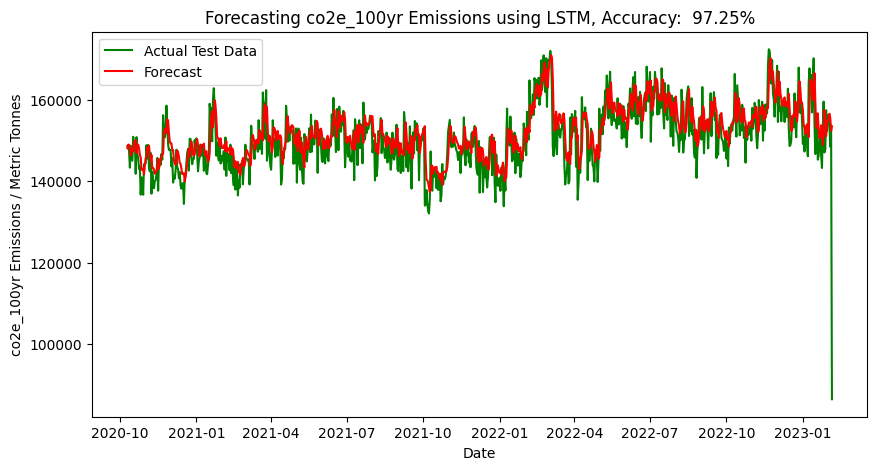


	Processing gas: co2e_20yr
Epoch 1/50
64/64 - 4s - loss: 0.0212 - 4s/epoch - 64ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0149 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0138 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0153 - 1s/epoch - 19ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0133 - 1s/epoch - 18ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0118 - 1s/epoch - 18ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0109 - 1s/epoch - 18ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0102 - 1s/epoch - 18ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0101 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0098 - 1s/epoch - 17ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0098 - 1s/epoch - 19ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0100 - 1s/epoch - 18ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0097 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0096 - 1s/epoch - 18ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0097 - 1s/epoch - 17ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0096 - 1s/epoch - 18ms/step
Epoch

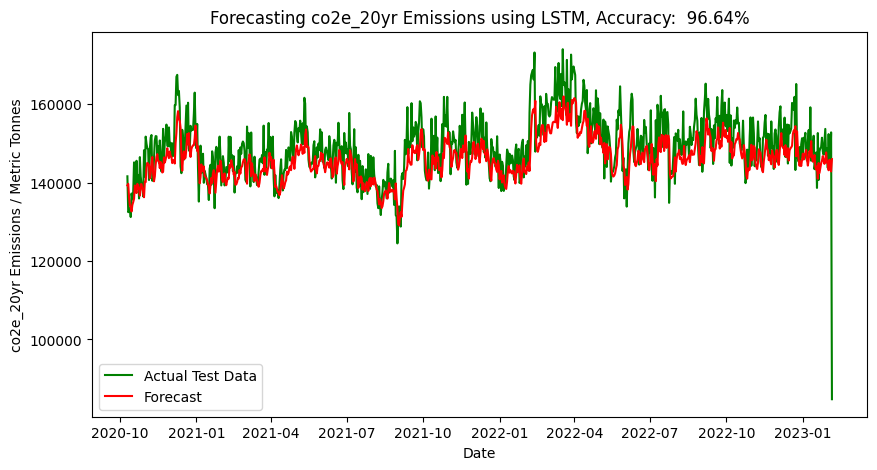


	Processing gas: n2o
Epoch 1/50
64/64 - 4s - loss: 0.0244 - 4s/epoch - 62ms/step
Epoch 2/50
64/64 - 1s - loss: 0.0159 - 1s/epoch - 19ms/step
Epoch 3/50
64/64 - 1s - loss: 0.0166 - 1s/epoch - 18ms/step
Epoch 4/50
64/64 - 1s - loss: 0.0142 - 1s/epoch - 19ms/step
Epoch 5/50
64/64 - 1s - loss: 0.0137 - 1s/epoch - 19ms/step
Epoch 6/50
64/64 - 1s - loss: 0.0130 - 1s/epoch - 19ms/step
Epoch 7/50
64/64 - 1s - loss: 0.0123 - 1s/epoch - 19ms/step
Epoch 8/50
64/64 - 1s - loss: 0.0120 - 1s/epoch - 19ms/step
Epoch 9/50
64/64 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 10/50
64/64 - 1s - loss: 0.0112 - 1s/epoch - 18ms/step
Epoch 11/50
64/64 - 1s - loss: 0.0111 - 1s/epoch - 18ms/step
Epoch 12/50
64/64 - 1s - loss: 0.0109 - 1s/epoch - 19ms/step
Epoch 13/50
64/64 - 1s - loss: 0.0117 - 1s/epoch - 18ms/step
Epoch 14/50
64/64 - 1s - loss: 0.0113 - 1s/epoch - 19ms/step
Epoch 15/50
64/64 - 1s - loss: 0.0111 - 1s/epoch - 18ms/step
Epoch 16/50
64/64 - 1s - loss: 0.0112 - 1s/epoch - 19ms/step
Epoch 17/50

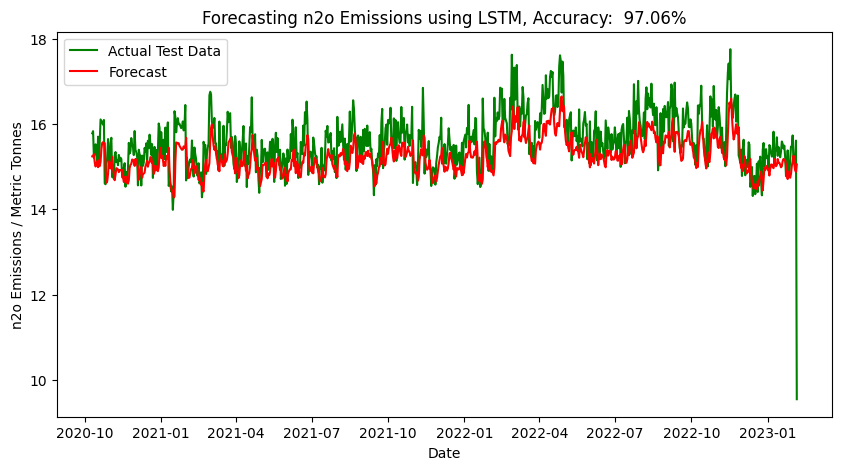

Processing:  90%|███████████████████████████████████████████████████████████████       | 9/10 [22:12<02:38, 158.16s/it]


Processing sector: waste


	Processing gas: ch4
Epoch 1/50
56/56 - 4s - loss: 0.0245 - 4s/epoch - 77ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0158 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0155 - 967ms/epoch - 17ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0147 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 19ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0135 - 1s/epoch - 18ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0124 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0120 - 996ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0121 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0122 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0121 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0116 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0117 - 1s/epoch - 19ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0114 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0116 -

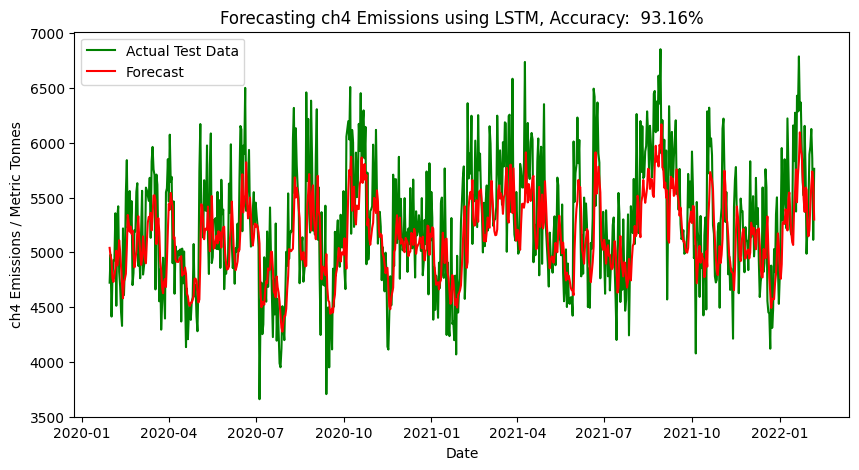


	Processing gas: co2

	Processing gas: co2e_100yr
Epoch 1/50
56/56 - 4s - loss: 0.0253 - 4s/epoch - 74ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0183 - 1s/epoch - 20ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0180 - 1s/epoch - 19ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0164 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0157 - 1s/epoch - 19ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0153 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0140 - 1s/epoch - 19ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0141 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0146 - 1s/epoch - 19ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0136 - 1s/epoch - 19ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0133 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0131 - 1s/epoch - 19ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0133 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0134 - 1s/epoch - 19ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0131 - 1s/epoch - 19ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0132 - 1s/

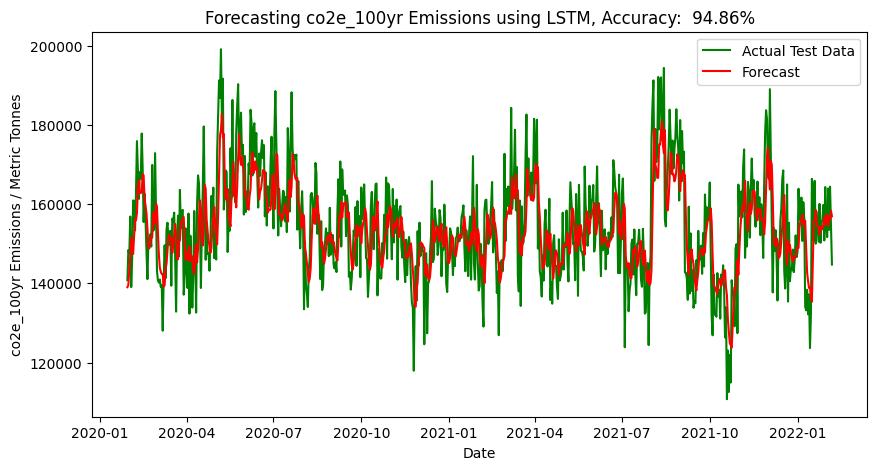


	Processing gas: co2e_20yr
Epoch 1/50
56/56 - 4s - loss: 0.0337 - 4s/epoch - 75ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0210 - 1s/epoch - 19ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0204 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0200 - 1s/epoch - 19ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0185 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0177 - 1s/epoch - 19ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0171 - 948ms/epoch - 17ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0169 - 1s/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0162 - 1s/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0165 - 1s/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0157 - 1s/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0156 - 1s/epoch - 18ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0153 - 995ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0161 - 1s/epoch - 18ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0150 - 1s/epoch - 18ms/step

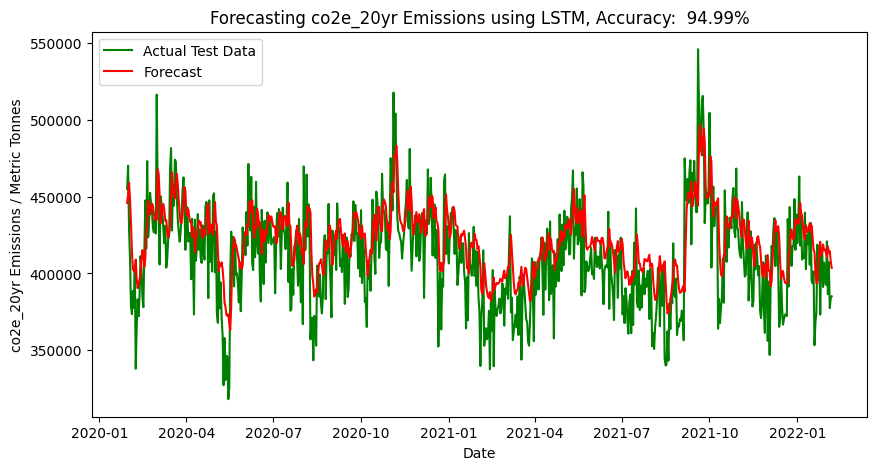


	Processing gas: n2o
Epoch 1/50
56/56 - 4s - loss: 0.0318 - 4s/epoch - 67ms/step
Epoch 2/50
56/56 - 1s - loss: 0.0192 - 997ms/epoch - 18ms/step
Epoch 3/50
56/56 - 1s - loss: 0.0177 - 1s/epoch - 18ms/step
Epoch 4/50
56/56 - 1s - loss: 0.0167 - 1s/epoch - 18ms/step
Epoch 5/50
56/56 - 1s - loss: 0.0152 - 1s/epoch - 18ms/step
Epoch 6/50
56/56 - 1s - loss: 0.0149 - 990ms/epoch - 18ms/step
Epoch 7/50
56/56 - 1s - loss: 0.0144 - 968ms/epoch - 17ms/step
Epoch 8/50
56/56 - 1s - loss: 0.0152 - 993ms/epoch - 18ms/step
Epoch 9/50
56/56 - 1s - loss: 0.0143 - 986ms/epoch - 18ms/step
Epoch 10/50
56/56 - 1s - loss: 0.0137 - 984ms/epoch - 18ms/step
Epoch 11/50
56/56 - 1s - loss: 0.0137 - 989ms/epoch - 18ms/step
Epoch 12/50
56/56 - 1s - loss: 0.0144 - 977ms/epoch - 17ms/step
Epoch 13/50
56/56 - 1s - loss: 0.0132 - 996ms/epoch - 18ms/step
Epoch 14/50
56/56 - 1s - loss: 0.0139 - 982ms/epoch - 18ms/step
Epoch 15/50
56/56 - 1s - loss: 0.0135 - 974ms/epoch - 17ms/step
Epoch 16/50
56/56 - 1s - loss: 0.0133 -

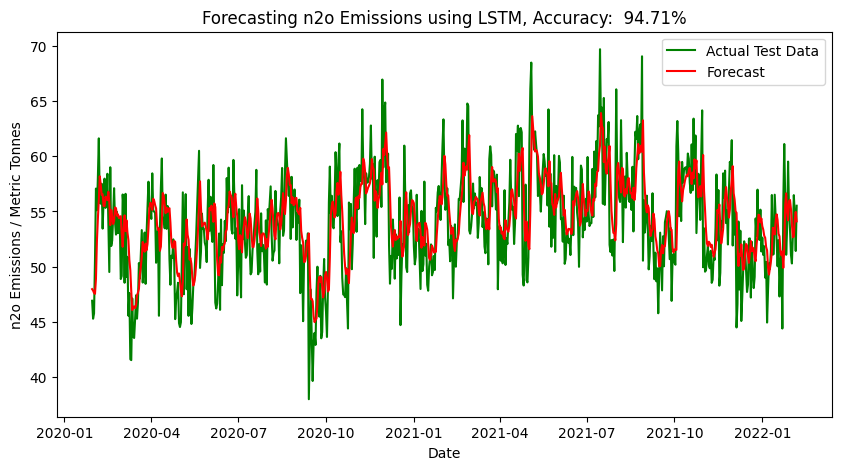

Processing: 100%|█████████████████████████████████████████████████████████████████████| 10/10 [24:18<00:00, 145.86s/it]


In [25]:
lstm_train(sector_files)

In [46]:
# Testing - 

# loading a sample model - 

from tensorflow.keras.models import load_model
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

model = load_model("Models/power/ch4.h5")
sample = {
    "start_time": ["2025-01-01", "2025-01-02"],
    "ch4": [1.2, 2.2]
}

start_time = sample.pop("start_time")

print(start_time)

sam_df = pd.DataFrame(sample, index=start_time)
scaler = MinMaxScaler(feature_range=(0, 1))


forecasts = model.predict(scaler.fit_transform(sam_df.values.reshape(-1, 1)))

print(scaler.inverse_transform(forecasts))

['2025-01-01', '2025-01-02']
1/1 [==============================] - 1s 700ms/step
[[1.2677706]
 [1.6362001]]


[[0.06777067]
 [0.43620002]]


In [47]:
!pip list

Package                            Version
---------------------------------- --------------
absl-py                            2.1.0
aggdraw                            1.3.18.post0
aiofiles                           23.2.1
alembic                            1.13.1
altair                             5.0.1
aniso8601                          9.0.1
annotated-types                    0.7.0
anyio                              4.2.0
argon2-cffi                        21.3.0
argon2-cffi-bindings               21.2.0
arrow                              1.3.0
astor                              0.8.1
asttokens                          2.0.5
astunparse                         1.6.3
async-timeout                      4.0.3
attrs                              23.1.0
backcall                           0.2.0
beautifulsoup4                     4.12.2
bleach                             4.1.0
blinker                            1.8.2
boto3                              1.29.1
botocore                        